In [34]:
import os
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns


from scipy.special import softmax
from sklearn.decomposition import PCA
from umap import UMAP

# Other

In [35]:
used_subjects = pd.read_csv("/neurospin/dico/data/deep_folding/current/datasets/schiz/used_schiz_subjects.csv")
used_subjects.sort_values(by='participant_id', inplace=True, ignore_index=True)
used_subjects

,participant_id,sex,age,diagnosis,study,site
0,10171,M,24.000000,control,CNP,CNP
1,10189,M,49.000000,control,CNP,CNP
2,10193,M,40.000000,control,CNP,CNP
3,10206,M,21.000000,control,CNP,CNP
4,10217,F,33.000000,control,CNP,CNP
...,...,...,...,...,...,...
1287,st110288,1.0,22.457534,schizophrenia,SCHIZCONNECT-VIP,vip
1288,va110289,1.0,48.536986,control,SCHIZCONNECT-VIP,vip
1289,ye110322,0.0,19.575342,schizophrenia,SCHIZCONNECT-VIP,vip
1290,yh100442,0.0,24.005479,control,SCHIZCONNECT-VIP,vip


In [3]:
# Studies
studies = ["schizconnect-vip", "bsnip", "cnp", "candi"]
# Data folders
root = os.path.join("/", "neurospin/psy_sbox/analyses/202205_predict_neurodev/data/root")
_root = os.path.join(root, "morphologist")
# Metadata csv
pd_files = "%s_t1mri_skeleton_participants.csv"
metadata_df = pd.concat([pd.read_csv(os.path.join(_root, pd_files % db)) 
                for db in studies], ignore_index=True, sort=False)
# Little hack
metadata_df.loc[metadata_df['session'].isna(), 'session'] = 1
metadata_df.loc[metadata_df['session'].isin(['v1', 'V1']), 'session'] = 1
metadata_df["session"] = metadata_df["session"].astype(int)
# Add set
dico_scheme = pickle.load(open(os.path.join(root, f"train_val_test_test-intra_scz_stratified.pkl"), "rb"))
unique_keys = ["participant_id", "session", "study"]
metadata_df["set"] = None
for split, scheme in dico_scheme.items():
    scheme['session'] = scheme['session'].astype(int)
    source_keys = metadata_df[unique_keys].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)
    assert len(set(source_keys)) == len(source_keys), f"Multiple identique identifiers found"
    target_keys = scheme[unique_keys].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)
    mask = source_keys.isin(target_keys).values.astype(bool)
    
    metadata_df.loc[mask, "set"] = split

In [4]:
metadata_df = metadata_df[~metadata_df.set.isnull()]
metadata_df['participant_id'] = metadata_df['participant_id'].astype(str)
metadata_df = metadata_df.set_index('participant_id')
metadata_df

,ni_path,session,run,sex,age,diagnosis,study,site,medication,cannabis_last_month,...,stopsignal,T1w,taskswitch,ScannerSerialNumber,ghost_NoGhost,Subject,Hand,YOB,MR Sessions,set
participant_id,,,,,,,,,,,,,,,,,,,,,
NM3356,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,0.0,24.0,schizophrenia,SCHIZCONNECT-VIP,WUSTL,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,validation
CH8095a,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,1.0,30.0,control,SCHIZCONNECT-VIP,NU,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,train
CH7131b,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,1.0,40.0,control,SCHIZCONNECT-VIP,NU,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test_intra
NM1023,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,0.0,23.0,schizophrenia,SCHIZCONNECT-VIP,WUSTL,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,train
CC8726,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,1.0,22.0,control,SCHIZCONNECT-VIP,WUSTL,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS099,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,0.0,0.0,schizophrenia,CANDI,CANDI,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,SS_099,R,NaN,1.0,train
HC012,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,1.0,0.0,control,CANDI,CANDI,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,HC_012,R,NaN,1.0,validation
HC010,/neurospin/psy_sbox/analyses/202205_predict_ne...,1,1,0.0,0.0,control,CANDI,CANDI,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,HC_010,R,NaN,1.0,validation


In [5]:
used_subjects = used_subjects.set_index('participant_id')
used_subjects['set'] = metadata_df['set']
used_subjects = used_subjects[~used_subjects.set.isnull()]
used_subjects
# 10 subjects missing

,sex,age,diagnosis,study,site,set
participant_id,,,,,,
INV07WT2ZL3,0.0,29.0,control,BSNIP,Dallas,train
INV0AL14J6U,0.0,43.0,schizophrenia,BSNIP,Dallas,train
INV14XK7P6E,0.0,30.0,control,BSNIP,Dallas,train
INV1HXNTXYF,1.0,18.0,control,BSNIP,Dallas,train
INV1XCNF4J5,1.0,25.0,control,BSNIP,Dallas,train
...,...,...,...,...,...,...
ESOC10060,1.0,26.0,control,PRAGUE,PRAGUE,train
ESOC10019,1.0,28.0,control,PRAGUE,PRAGUE,train
ESOC10063,0.0,31.0,control,PRAGUE,PRAGUE,train


# Output visualisation

## Functions

In [49]:
def get_sites(df, used_subjects):
    partial_subjects = used_subjects[used_subjects.participant_id.isin(df.participant_id)]
    partial_subjects = partial_subjects.sort_values(by='participant_id')
    df.sort_values(by='participant_id', inplace=True)
    df['site'] = partial_subjects['site'].values
    return df

In [50]:
# load and preprocess stuff
def load_and_process(load_path):
    used_subjects = pd.read_csv("/neurospin/dico/data/deep_folding/current/datasets/schiz/used_schiz_subjects.csv")
    used_subjects.participant_id = used_subjects.participant_id.astype(str)

    train_outputs = pd.read_csv(load_path + '/train_outputs.csv')
    val_outputs = pd.read_csv(load_path + '/val_outputs.csv')
    test_outputs = pd.read_csv(load_path + '/test_outputs.csv')
    test_intra_outputs = pd.read_csv(load_path + '/test_intra_outputs.csv')

    train_outputs = train_outputs.rename(columns={'ID': 'participant_id'})
    train_outputs = get_sites(train_outputs, used_subjects)

    val_outputs = val_outputs.rename(columns={'ID': 'participant_id'})
    val_outputs = get_sites(val_outputs, used_subjects)

    test_outputs = test_outputs.rename(columns={'ID': 'participant_id'})
    test_outputs = get_sites(test_outputs, used_subjects)

    test_intra_outputs = test_intra_outputs.rename(columns={'ID': 'participant_id'})
    test_intra_outputs = get_sites(test_intra_outputs, used_subjects)

    return train_outputs, val_outputs, test_intra_outputs, test_outputs

In [51]:
def plot_outputs():
    plt.figure(figsize=(14,10))

    plt.subplot(221)
    sns.scatterplot(train_outputs, x='dim1', y ='dim2', hue='site', alpha=0.2)

    plt.title('train')

    plt.subplot(222)
    sns.scatterplot(val_outputs, x='dim1', y ='dim2', hue='site', alpha=0.7)
    plt.title("val")

    plt.subplot(223)
    sns.scatterplot(test_intra_outputs, x='dim1', y ='dim2', hue='site', alpha=0.7)
    plt.title('test_intra')

    plt.subplot(224)
    sns.scatterplot(test_outputs, x='dim1', y ='dim2', hue='site', alpha=0.7)
    plt.title("test")

    plt.show()

    plt.figure(figsize=(18,12))

    plt.subplot(221)
    sns.scatterplot(train_outputs, x='dim1', y ='dim2', hue='labels', alpha=0.2)

    plt.title('train')

    plt.subplot(222)
    sns.scatterplot(val_outputs, x='dim1', y ='dim2', hue='labels', alpha=0.7)
    plt.title("val")

    plt.subplot(223)
    sns.scatterplot(test_intra_outputs, x='dim1', y ='dim2', hue='labels', alpha=0.7)
    plt.title('test_intra')

    plt.subplot(224)
    sns.scatterplot(test_outputs, x='dim1', y ='dim2', hue='labels', alpha=0.7)
    plt.title("test")

    plt.show()

In [52]:
def get_softmax(df):
    X = df[['dim1', 'dim2']].values
    return softmax(X, axis=1)

def add_softmax(df):
    soft = get_softmax(df)
    soft1 = soft[:,0]
    soft2 = soft[:,1]
    df['soft1'] = soft1
    df['soft2'] = soft2

    return df

def plot_soft(df, hue='site'):
    sns.stripplot(df, x='soft2', y=hue, hue='labels', alpha=0.5)
    plt.axvline(x=[0.5], color='black')

def plot_softmaxes():

    plt.figure(figsize=(14,10))

    plt.subplot(221)
    plot_soft(train_outputs)
    plt.title('train')

    plt.subplot(222)
    plot_soft(val_outputs)
    plt.title("val")

    plt.subplot(223)
    plot_soft(test_intra_outputs)
    plt.title('test_intra')

    plt.subplot(224)
    plot_soft(test_outputs)
    plt.title("test")

    plt.show()


    plt.figure(figsize=(14,10))

    plt.subplot(221)
    sns.stripplot(train_outputs, x='soft2', hue='labels', alpha=0.5)
    plt.axvline(x=[0.5], color='black')
    plt.title('train')

    plt.subplot(222)
    sns.stripplot(val_outputs, x='soft2', hue='labels', alpha=0.5)
    plt.axvline(x=[0.5], color='black')
    plt.title("val")

    plt.subplot(223)
    sns.stripplot(test_intra_outputs, x='soft2', hue='labels', alpha=0.5)
    plt.axvline(x=[0.5], color='black')
    plt.title('test_intra')

    plt.subplot(224)
    sns.stripplot(test_outputs, x='soft2', hue='labels', alpha=0.5)
    plt.axvline(x=[0.5], color='black')
    plt.title("test")

    plt.show()

## Ok model

In [6]:
used_subjects = pd.read_csv("/neurospin/dico/data/deep_folding/current/datasets/schiz/used_schiz_subjects.csv")
used_subjects.participant_id = used_subjects.participant_id.astype(str)
used_subjects

,participant_id,sex,age,diagnosis,study,site
0,INV07WT2ZL3,0.0,29.0,control,BSNIP,Dallas
1,INV0AL14J6U,0.0,43.0,schizophrenia,BSNIP,Dallas
2,INV14XK7P6E,0.0,30.0,control,BSNIP,Dallas
3,INV1HXNTXYF,1.0,18.0,control,BSNIP,Dallas
4,INV1XCNF4J5,1.0,25.0,control,BSNIP,Dallas
...,...,...,...,...,...,...
1287,ESOC10060,1.0,26.0,control,PRAGUE,PRAGUE
1288,ESOC10019,1.0,28.0,control,PRAGUE,PRAGUE
1289,ESOC10063,0.0,31.0,control,PRAGUE,PRAGUE
1290,ESOC10098,1.0,27.0,control,PRAGUE,PRAGUE


In [7]:
train_outputs = pd.read_csv('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/both/15-44-37_2/cing_schiz_outputs/train_outputs.csv')
val_outputs = pd.read_csv('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/both/15-44-37_2/cing_schiz_outputs/val_outputs.csv')
test_outputs = pd.read_csv('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/both/15-44-37_2/cing_schiz_outputs/test_outputs.csv')
test_intra_outputs = pd.read_csv('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/both/15-44-37_2/cing_schiz_outputs/test_intra_outputs.csv')

In [9]:
train_outputs = train_outputs.rename(columns={'ID': 'participant_id'})
train_outputs = get_sites(train_outputs, used_subjects)
train_outputs

,participant_id,labels,dim1,dim2,site
0,10171,0,0.882429,-0.470047,CNP
1,10189,0,0.559918,-0.481361,CNP
2,10193,0,1.260131,-0.600974,CNP
3,10206,0,1.066331,-0.529282,CNP
4,10225,0,1.088941,-0.552744,CNP
...,...,...,...,...,...
923,st110288,1,0.426142,-0.224318,vip
924,va110289,0,0.699114,-0.414876,vip
925,ye110322,1,1.098404,-0.679528,vip
926,yh100442,0,1.231017,-0.627339,vip


In [10]:
val_outputs = val_outputs.rename(columns={'ID': 'participant_id'})
val_outputs = get_sites(val_outputs, used_subjects)

test_outputs = test_outputs.rename(columns={'ID': 'participant_id'})
test_outputs = get_sites(test_outputs, used_subjects)

test_intra_outputs = test_intra_outputs.rename(columns={'ID': 'participant_id'})
test_intra_outputs = get_sites(test_intra_outputs, used_subjects)

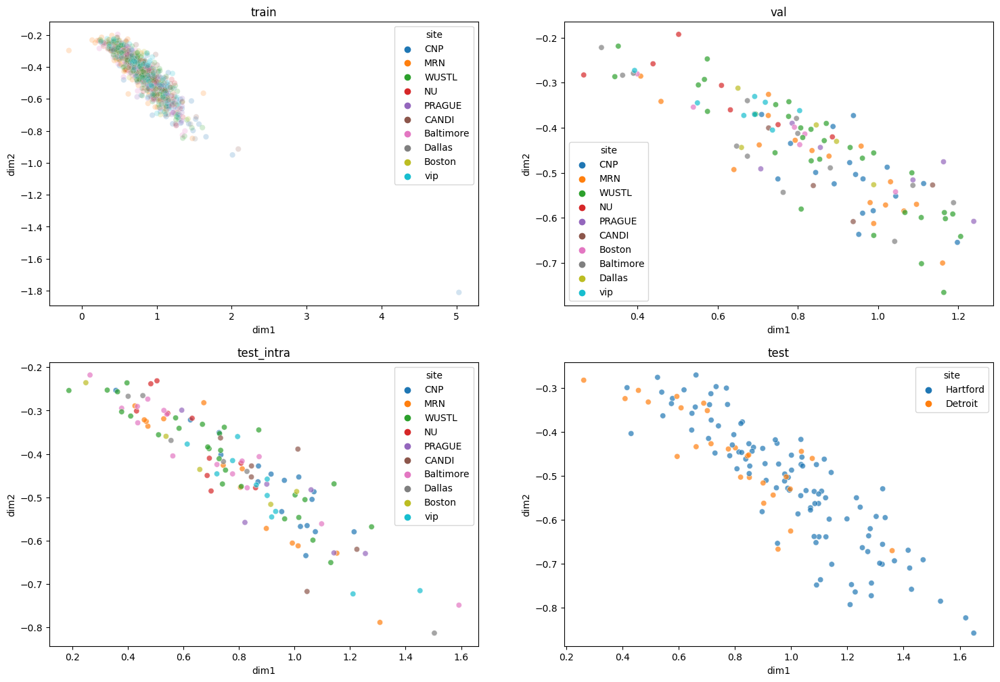

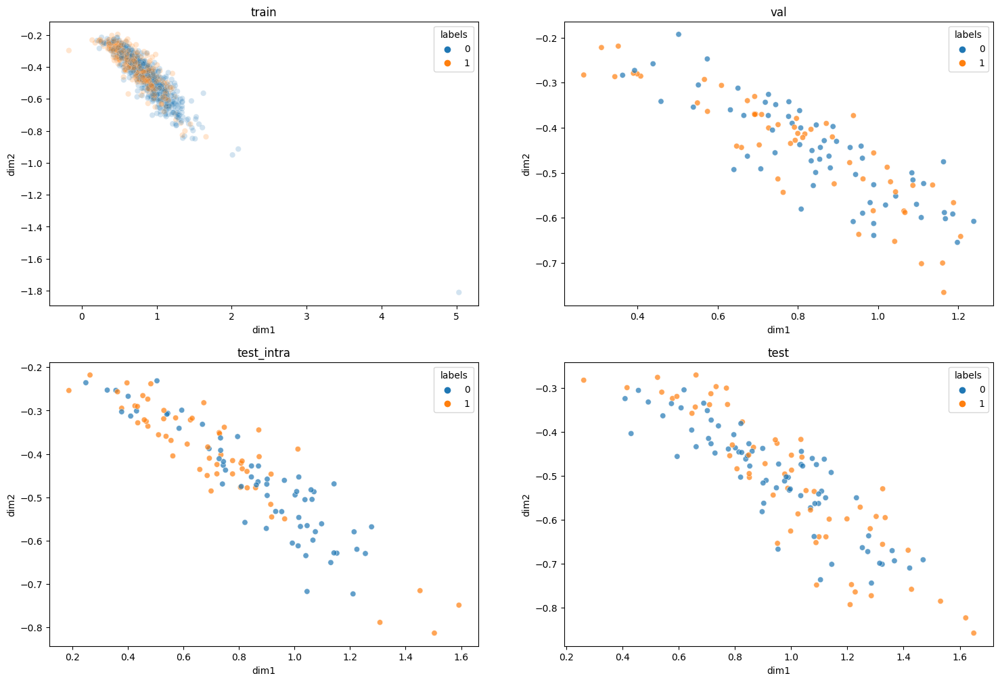

In [11]:
plot_outputs()

In [12]:
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)

train_outputs

,participant_id,labels,dim1,dim2,site,soft1,soft2
0,10171,0,0.882429,-0.470047,CNP,0.794534,0.205466
1,10189,0,0.559918,-0.481361,CNP,0.739097,0.260903
2,10193,0,1.260131,-0.600974,CNP,0.865426,0.134574
3,10206,0,1.066331,-0.529282,CNP,0.831404,0.168596
4,10225,0,1.088941,-0.552744,CNP,0.837764,0.162236
...,...,...,...,...,...,...,...
923,st110288,1,0.426142,-0.224318,vip,0.657114,0.342886
924,va110289,0,0.699114,-0.414876,vip,0.752872,0.247128
925,ye110322,1,1.098404,-0.679528,vip,0.855441,0.144559
926,yh100442,0,1.231017,-0.627339,vip,0.865105,0.134895


#### Plot softmax values

In [13]:
def plot_soft(df, hue='site'):
    sns.stripplot(df, x='soft2', y=hue, hue='labels', alpha=0.5)
    plt.axvline(x=[0.5], color='black')

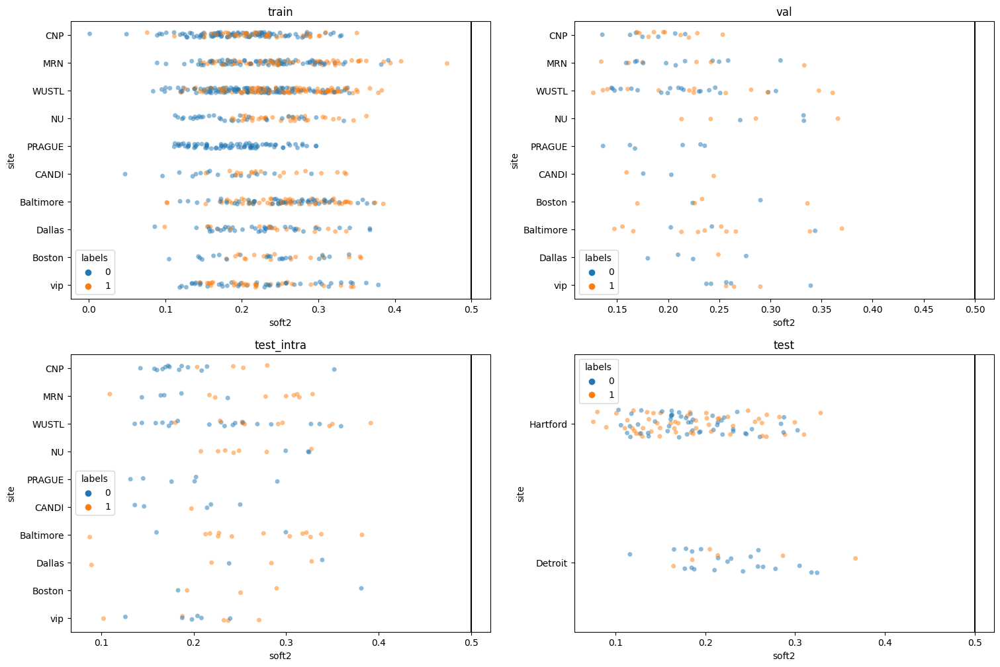

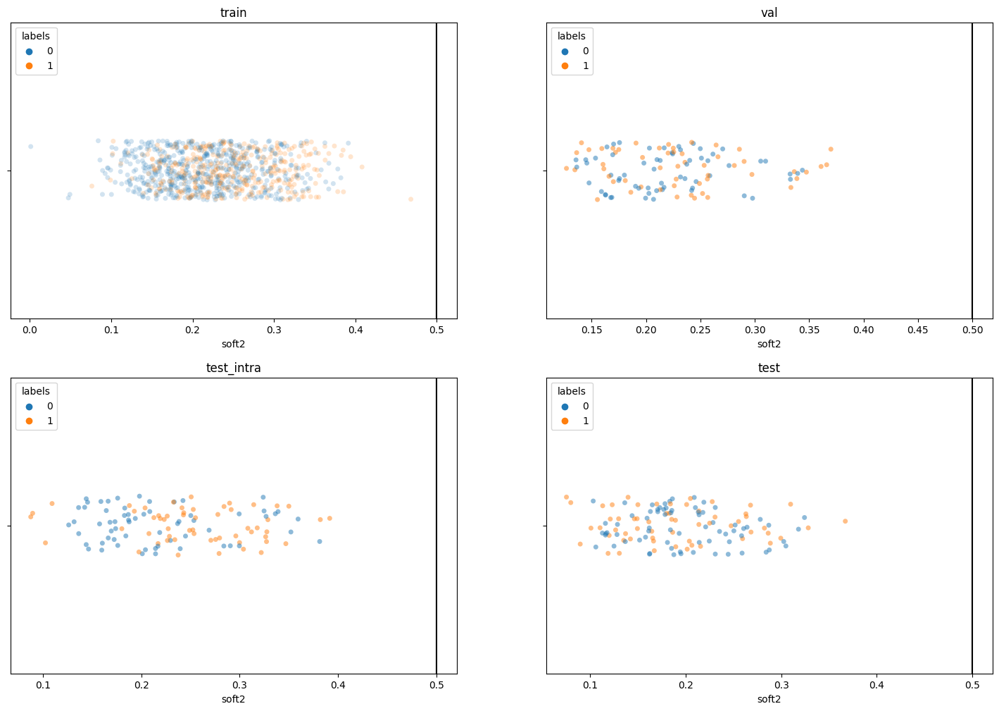

In [14]:
plt.figure(figsize=(18,12))

plt.subplot(221)
plot_soft(train_outputs)
plt.title('train')

plt.subplot(222)
plot_soft(val_outputs)
plt.title("val")

plt.subplot(223)
plot_soft(test_intra_outputs)
plt.title('test_intra')

plt.subplot(224)
plot_soft(test_outputs)
plt.title("test")

plt.show()


plt.figure(figsize=(18,12))

plt.subplot(221)
sns.stripplot(train_outputs, x='soft2', hue='labels', alpha=0.2)
plt.axvline(x=[0.5], color='black')
plt.title('train')

plt.subplot(222)
sns.stripplot(val_outputs, x='soft2', hue='labels', alpha=0.5)
plt.axvline(x=[0.5], color='black')
plt.title("val")

plt.subplot(223)
sns.stripplot(test_intra_outputs, x='soft2', hue='labels', alpha=0.5)
plt.axvline(x=[0.5], color='black')
plt.title('test_intra')

plt.subplot(224)
sns.stripplot(test_outputs, x='soft2', hue='labels', alpha=0.5)
plt.axvline(x=[0.5], color='black')
plt.title("test")

plt.show()

## Overfitting model

In [15]:
used_subjects = pd.read_csv("/neurospin/dico/data/deep_folding/current/datasets/schiz/used_schiz_subjects.csv")
used_subjects.participant_id = used_subjects.participant_id.astype(str)
used_subjects

,participant_id,sex,age,diagnosis,study,site
0,INV07WT2ZL3,0.0,29.0,control,BSNIP,Dallas
1,INV0AL14J6U,0.0,43.0,schizophrenia,BSNIP,Dallas
2,INV14XK7P6E,0.0,30.0,control,BSNIP,Dallas
3,INV1HXNTXYF,1.0,18.0,control,BSNIP,Dallas
4,INV1XCNF4J5,1.0,25.0,control,BSNIP,Dallas
...,...,...,...,...,...,...
1287,ESOC10060,1.0,26.0,control,PRAGUE,PRAGUE
1288,ESOC10019,1.0,28.0,control,PRAGUE,PRAGUE
1289,ESOC10063,0.0,31.0,control,PRAGUE,PRAGUE
1290,ESOC10098,1.0,27.0,control,PRAGUE,PRAGUE


In [17]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/both/11-19-53_1/cing_schiz_outputs')

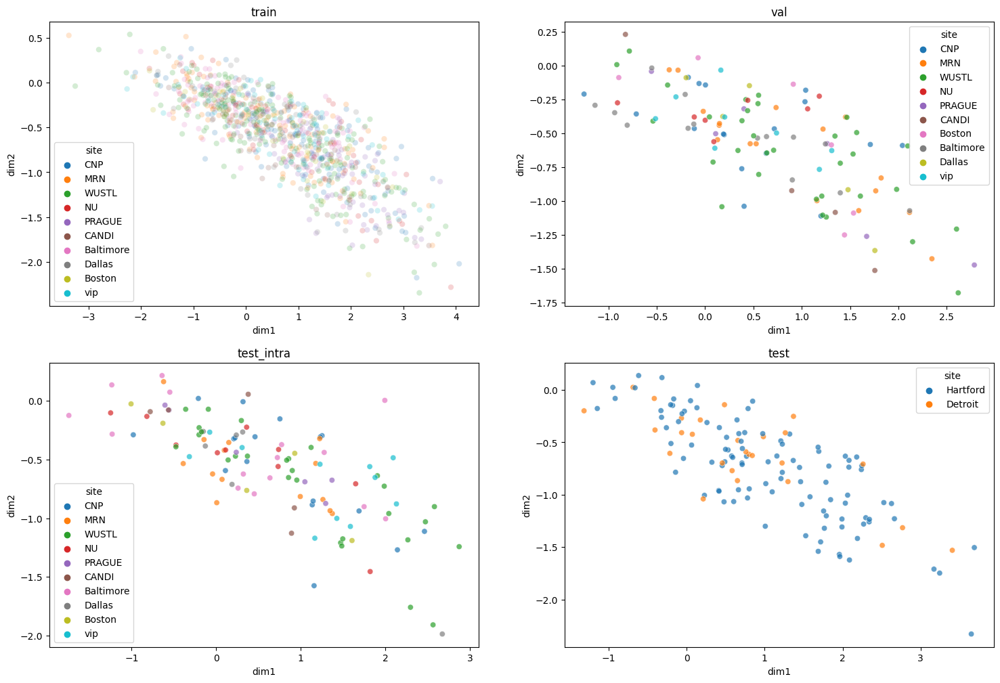

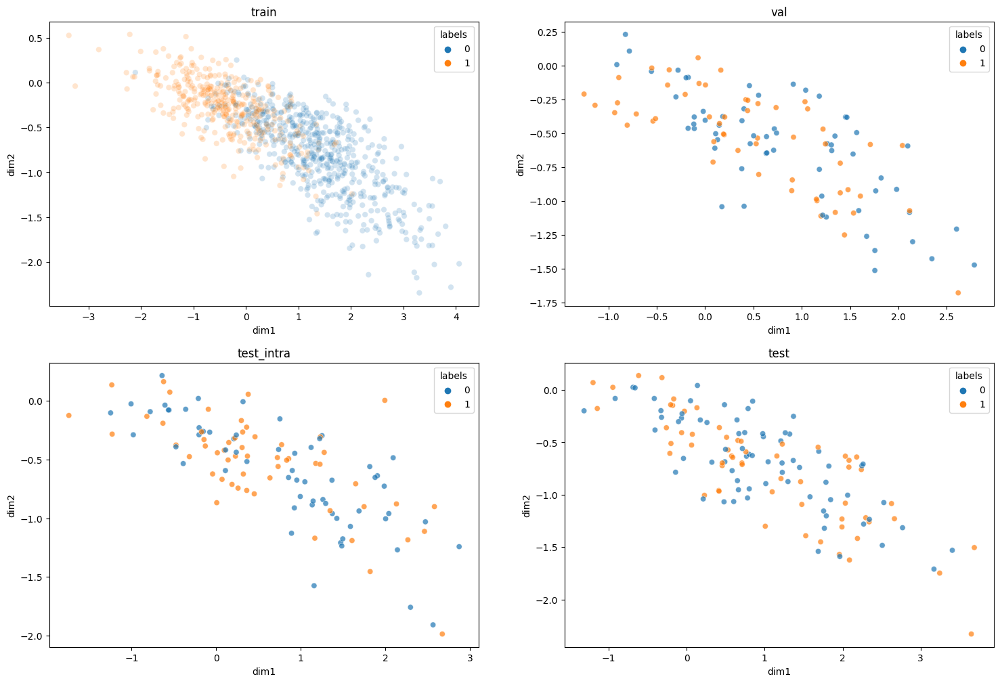

In [18]:
# les sorties

plot_outputs()

  participant_id  labels      dim1      dim2 site     soft1     soft2
0          10171       0 -0.575563 -0.125954  CNP  0.389454  0.610546
1          10189       0  1.747598 -1.576106  CNP  0.965233  0.034767
2          10193       0  1.554048 -0.800412  CNP  0.913288  0.086712
3          10206       0  0.937587 -0.581430  CNP  0.820394  0.179606
4          10225       0  1.192566 -1.144736  CNP  0.911920  0.088080


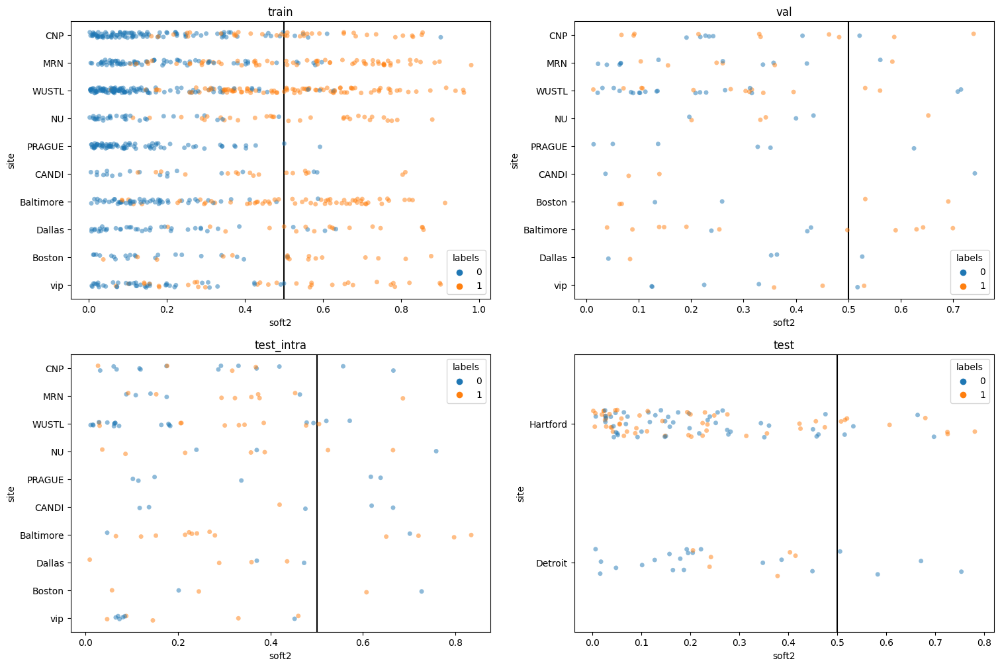

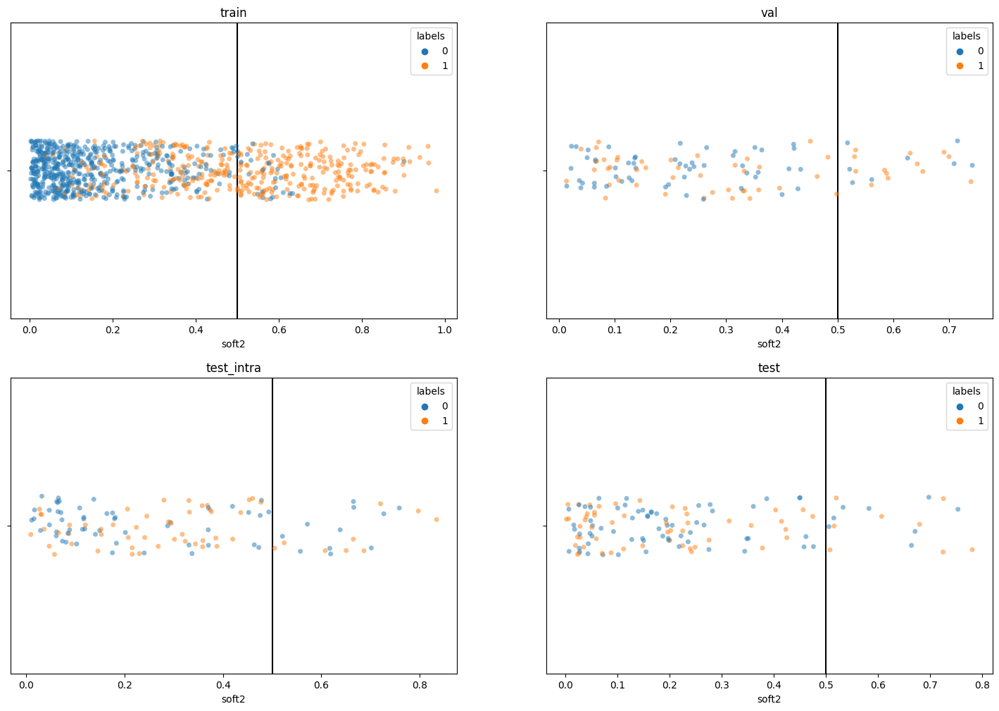

In [19]:
# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)

print(train_outputs.head())

plot_softmaxes()

## Models weigthed during training

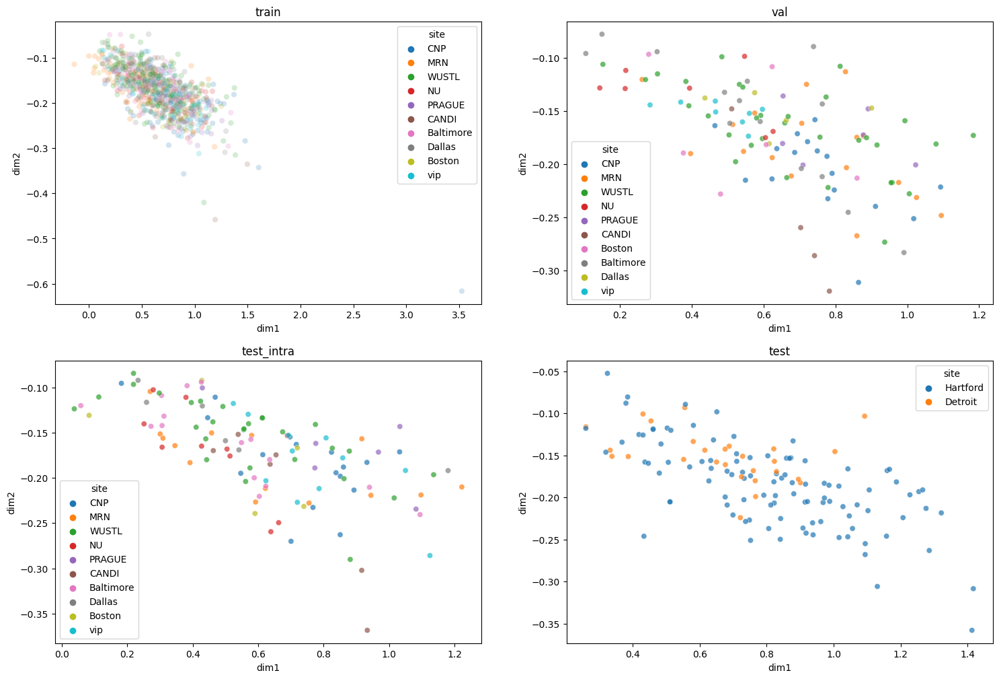

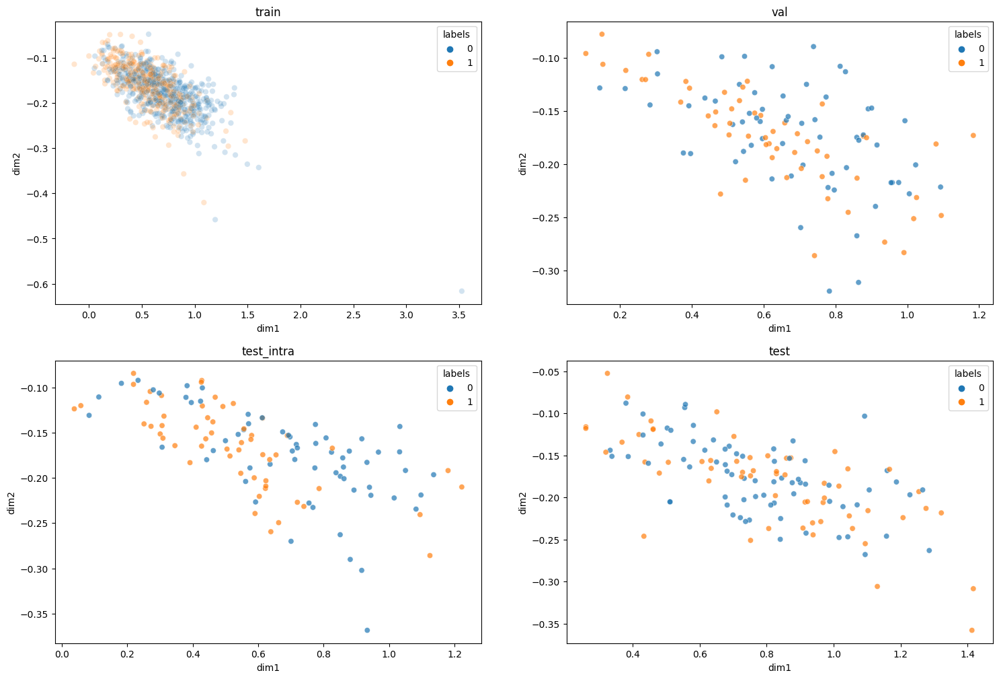

In [28]:
# les sorties
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/2023-06-08/proportional_weights/10-57-28_0/cing_schiz_outputs')

plot_outputs()

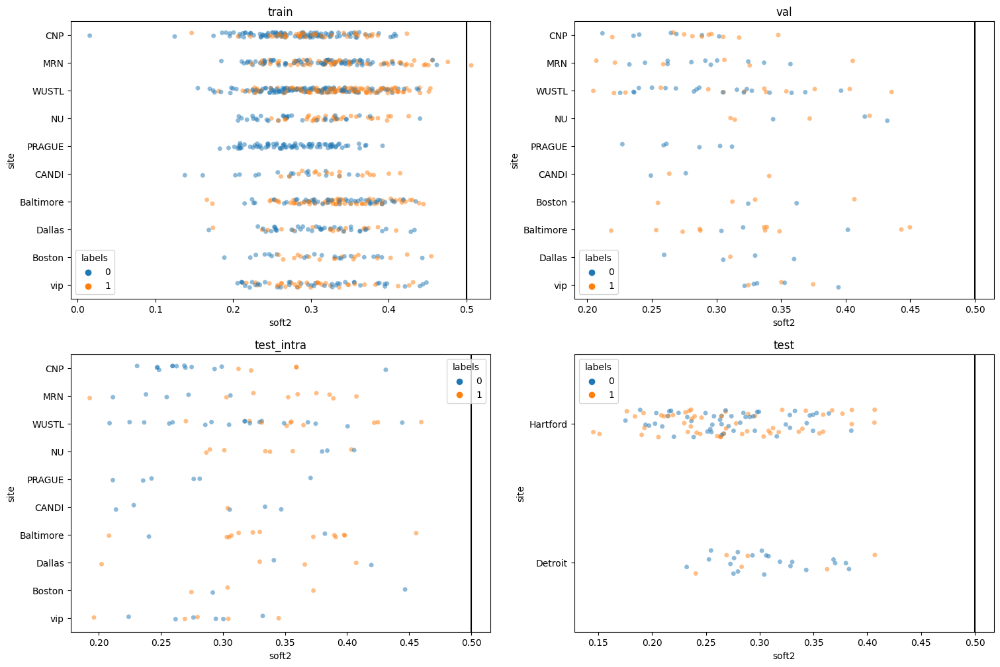

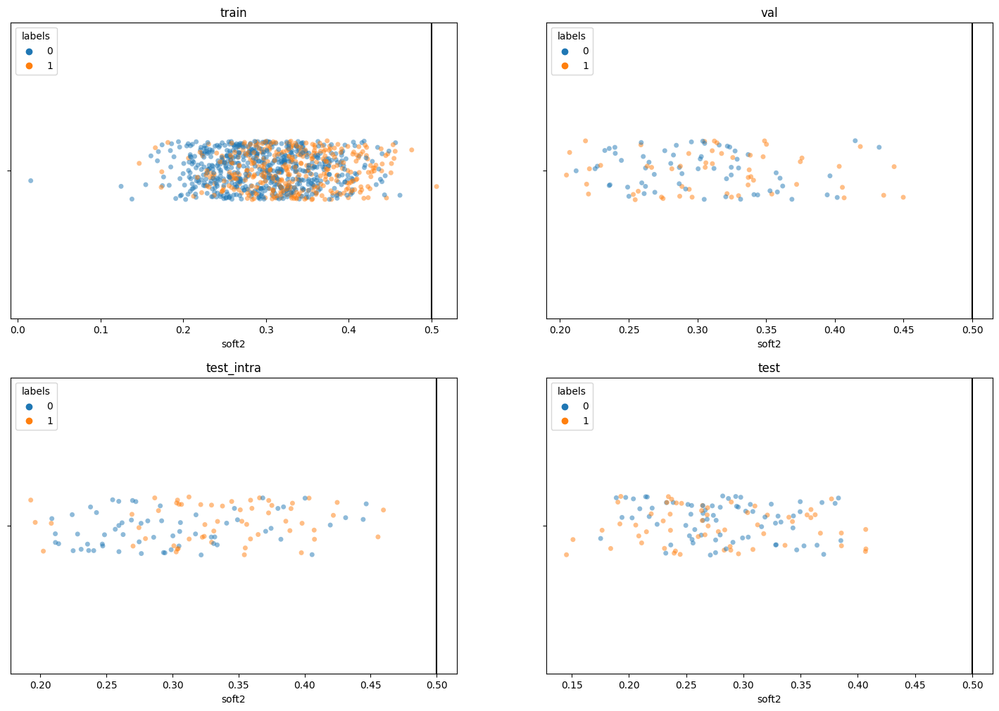

In [22]:
# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

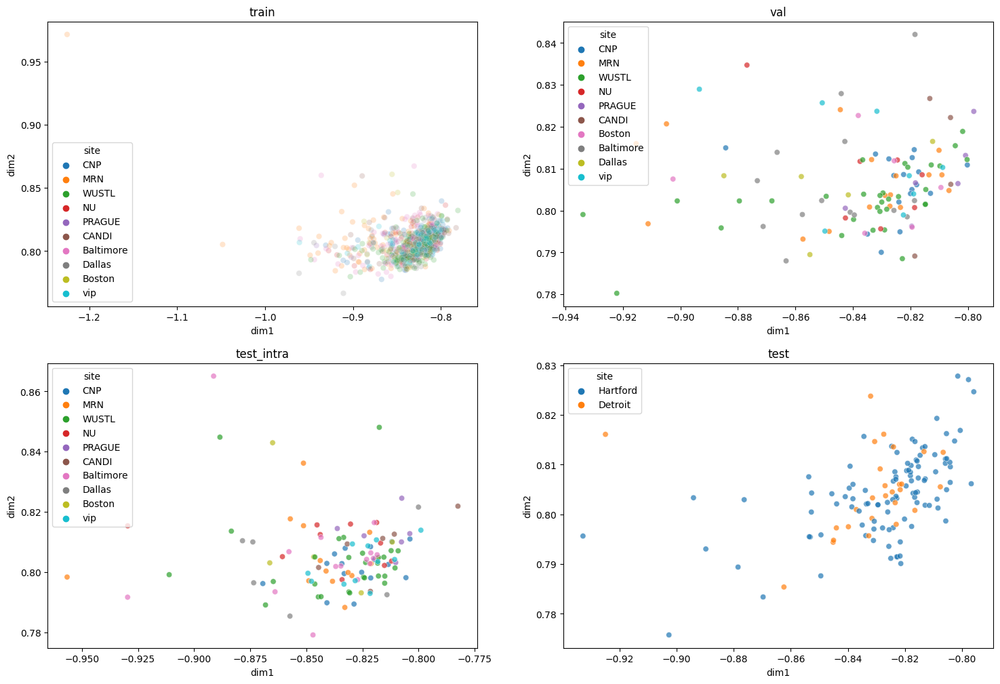

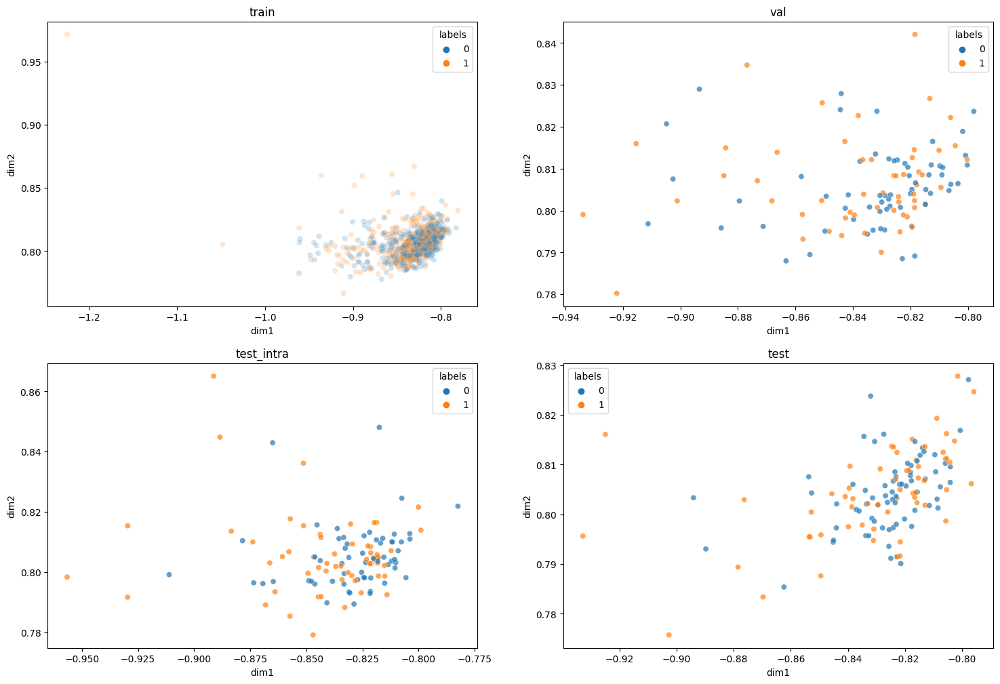

In [29]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/2023-06-08/excessive_weights/11-41-54_0/cing_schiz_outputs')
# les sorties
plot_outputs()

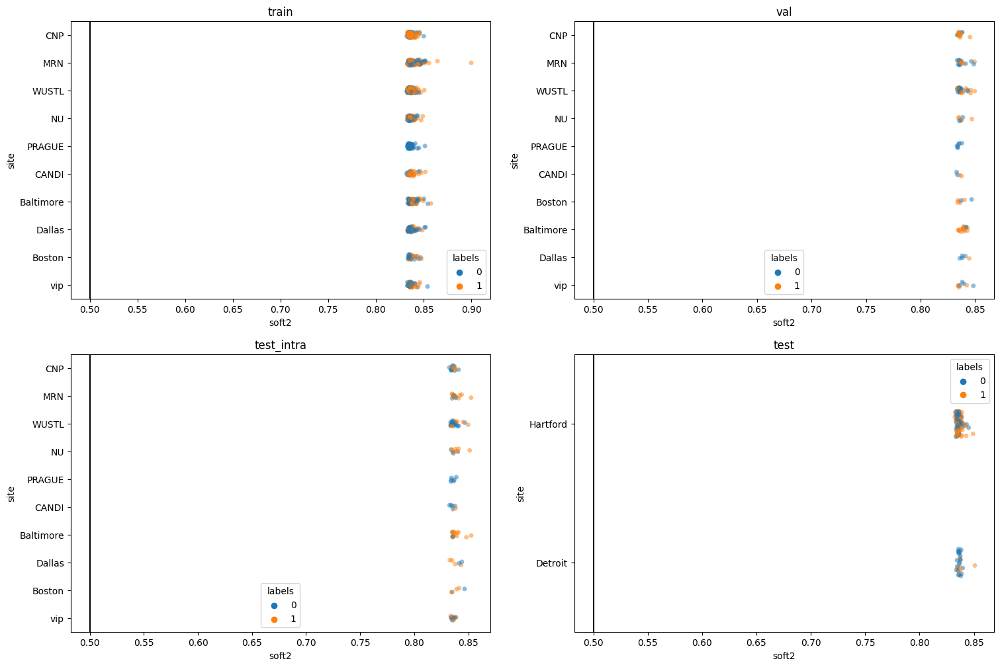

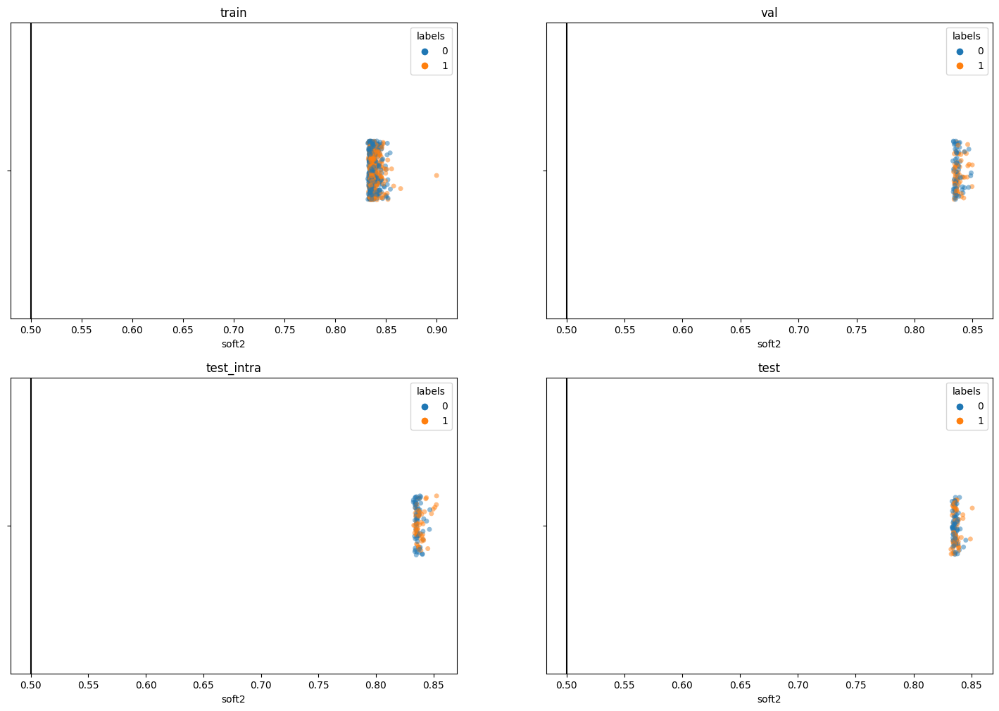

In [30]:
# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

## New stratification

### Overfitting

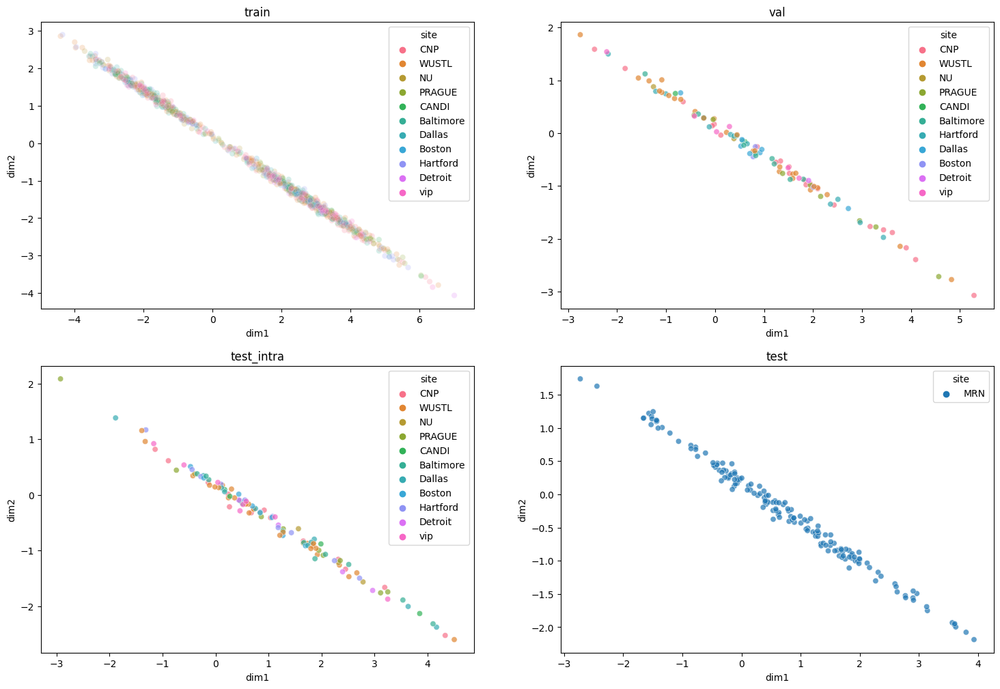

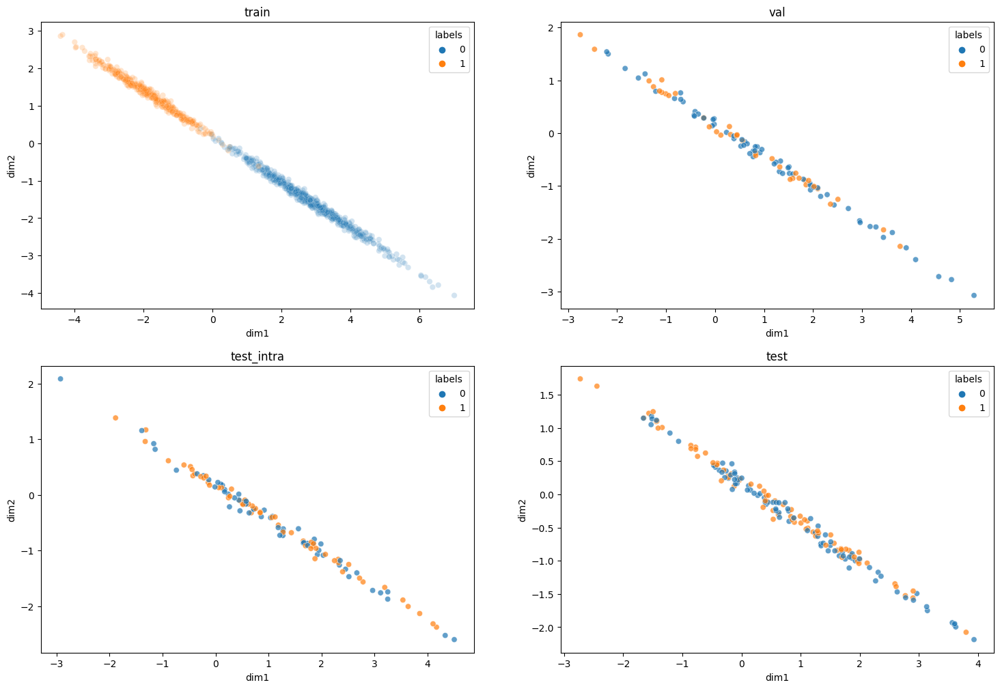

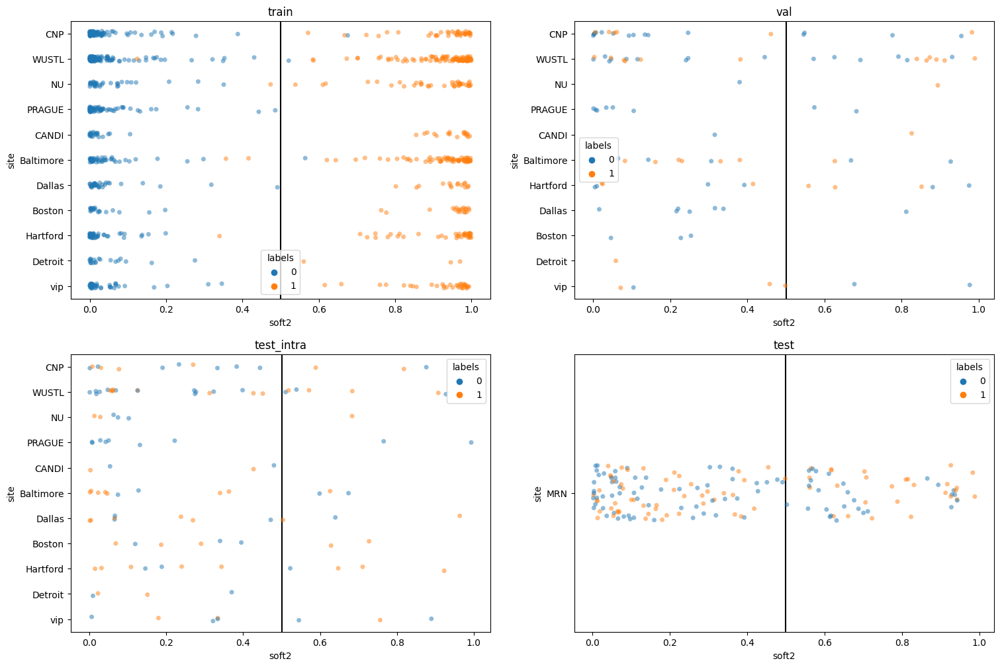

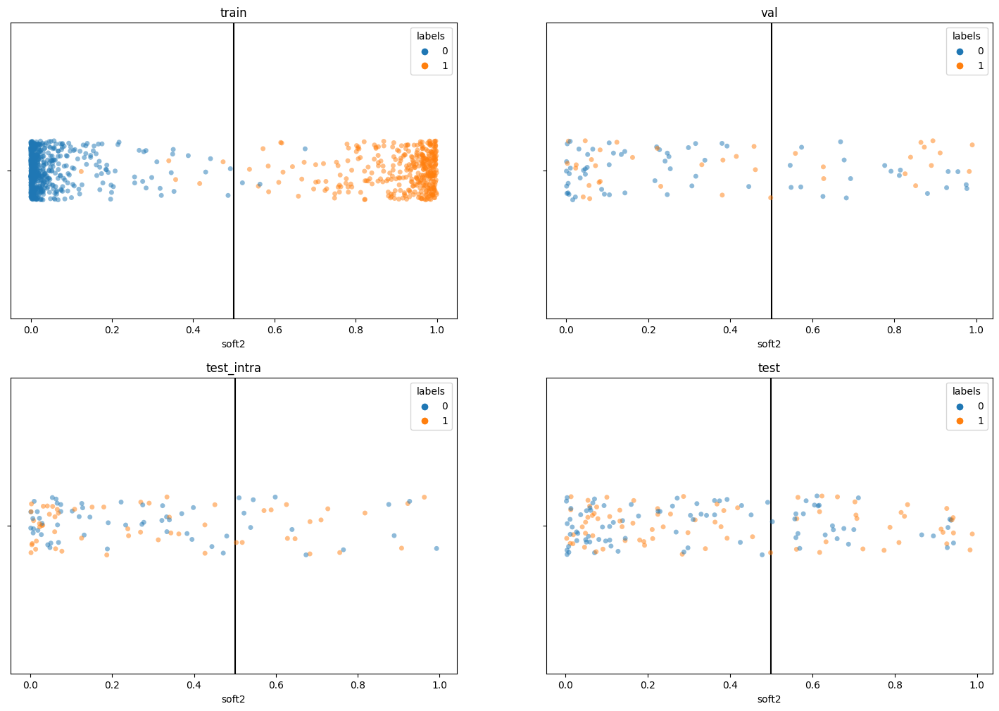

In [32]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/strat_bis_R/09-12-56_2/cing_schiz_strat_bis_outputs')

plot_outputs()

# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

### not overfitting

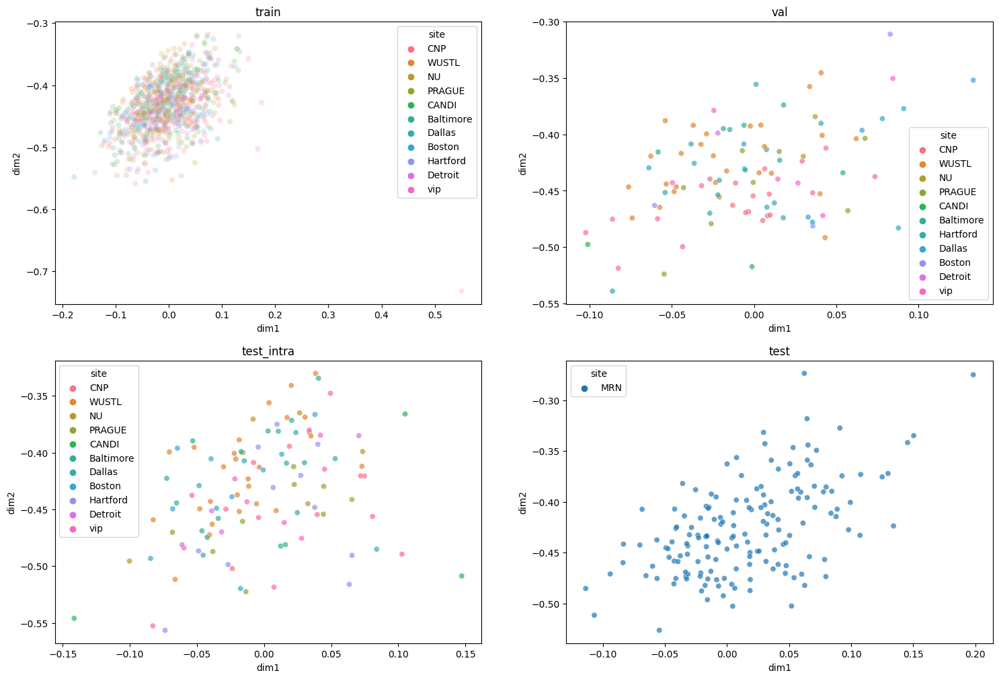

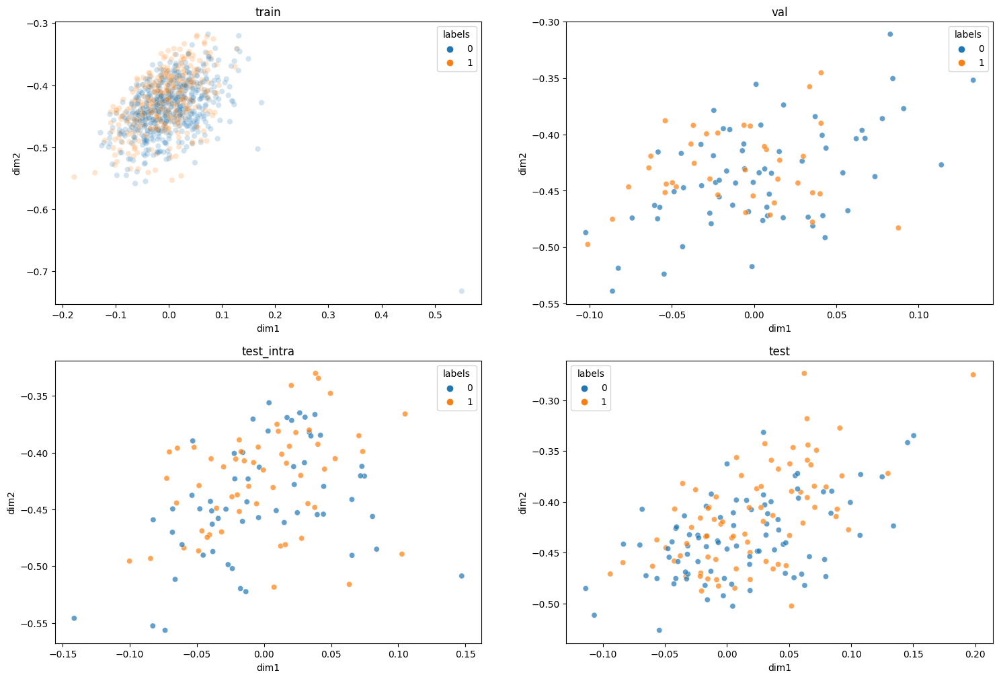

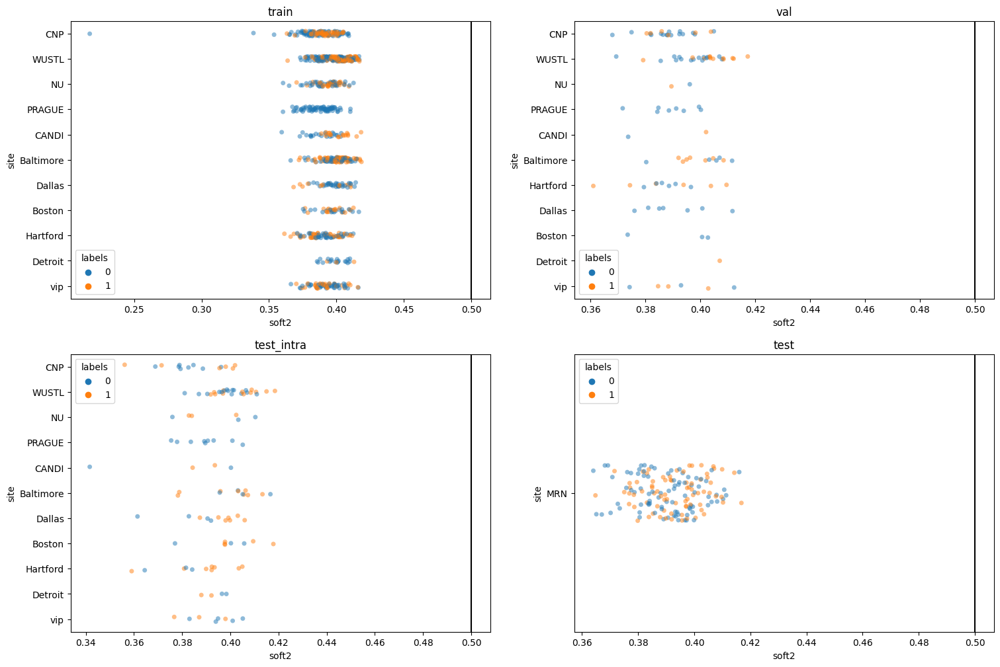

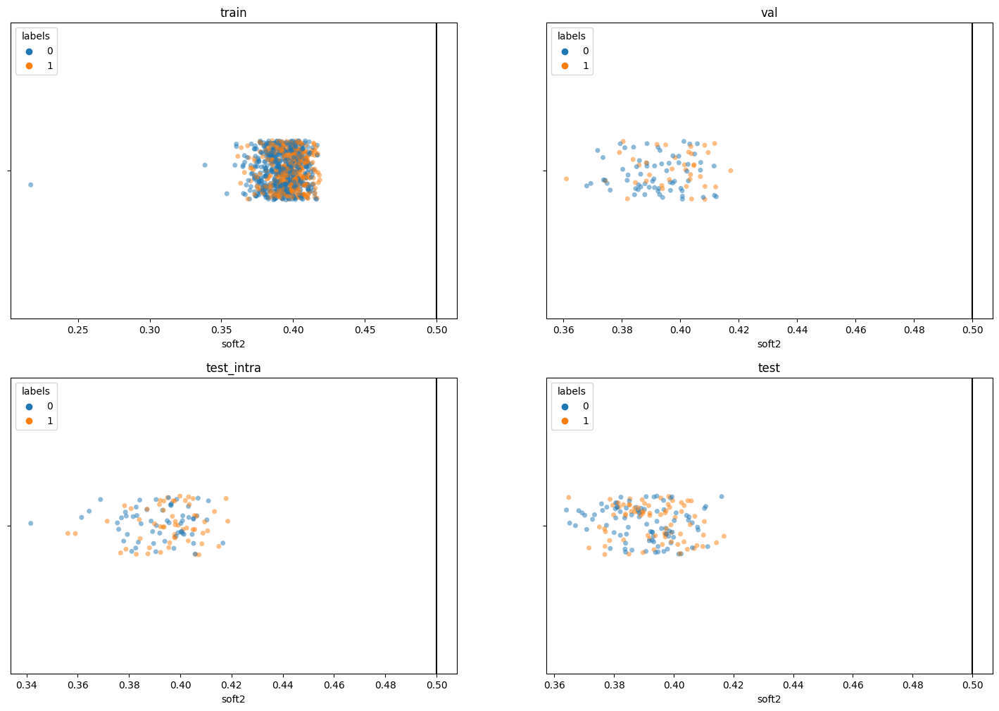

In [34]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/strat_bis_R/16-23-39_3/cing_schiz_strat_bis_outputs')

plot_outputs()

# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

### lr = 1e-3

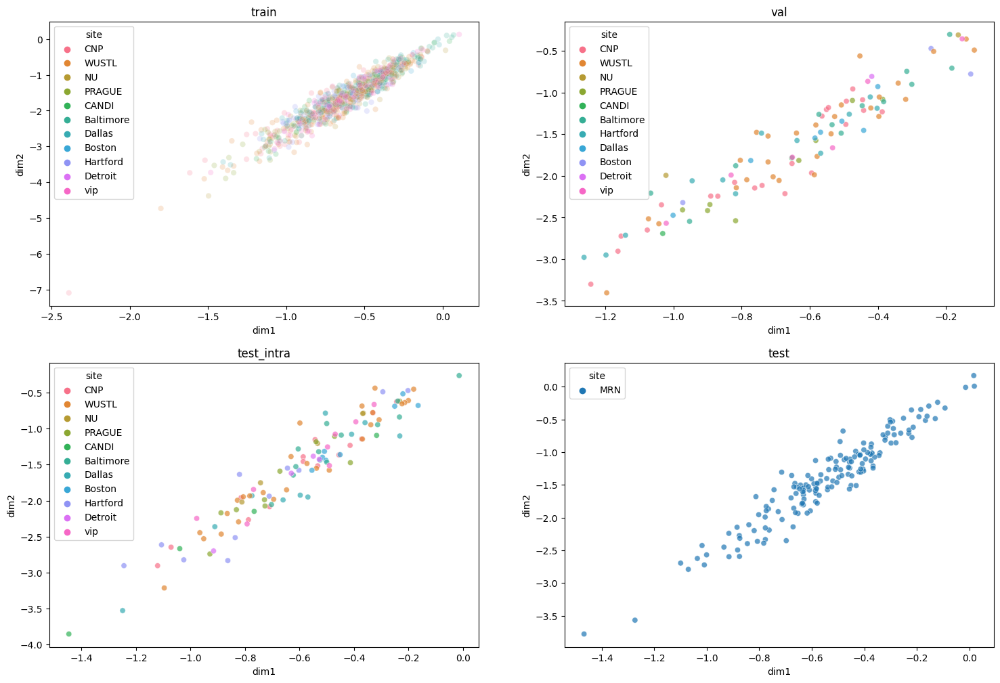

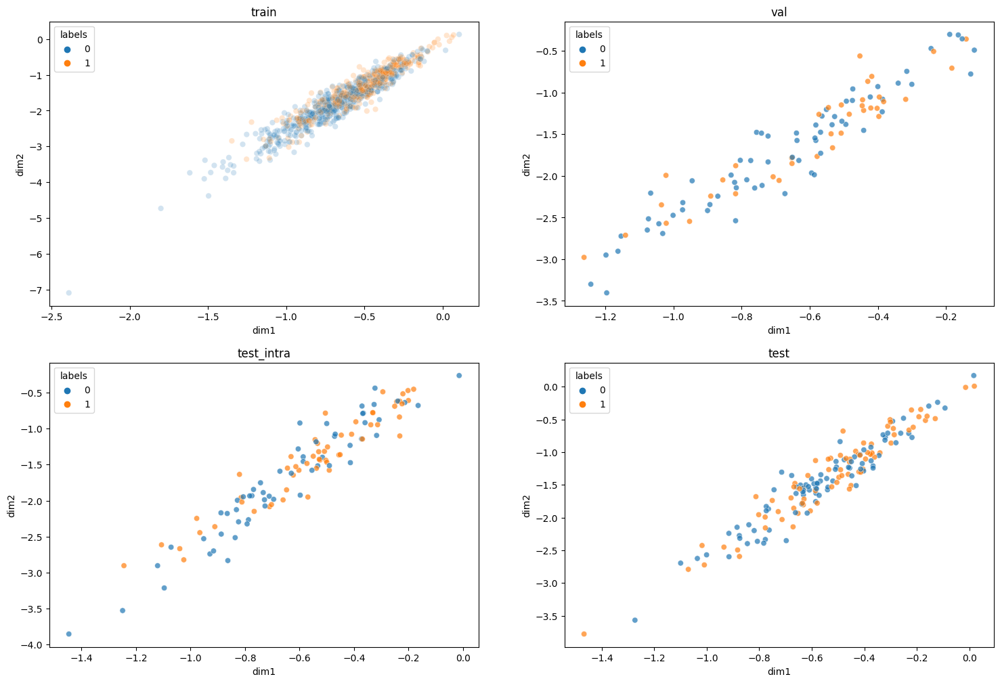

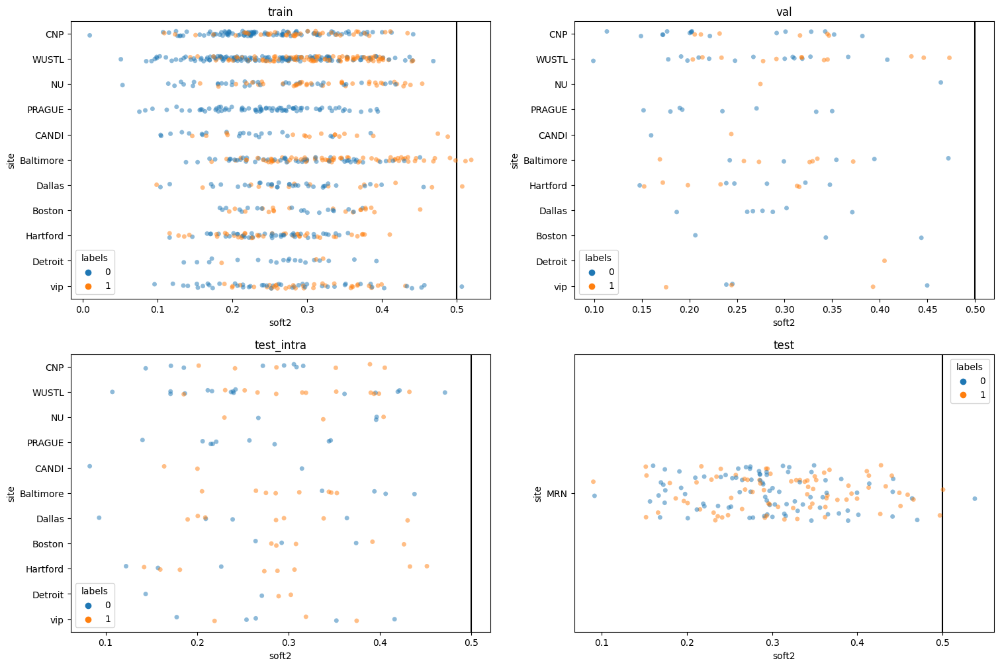

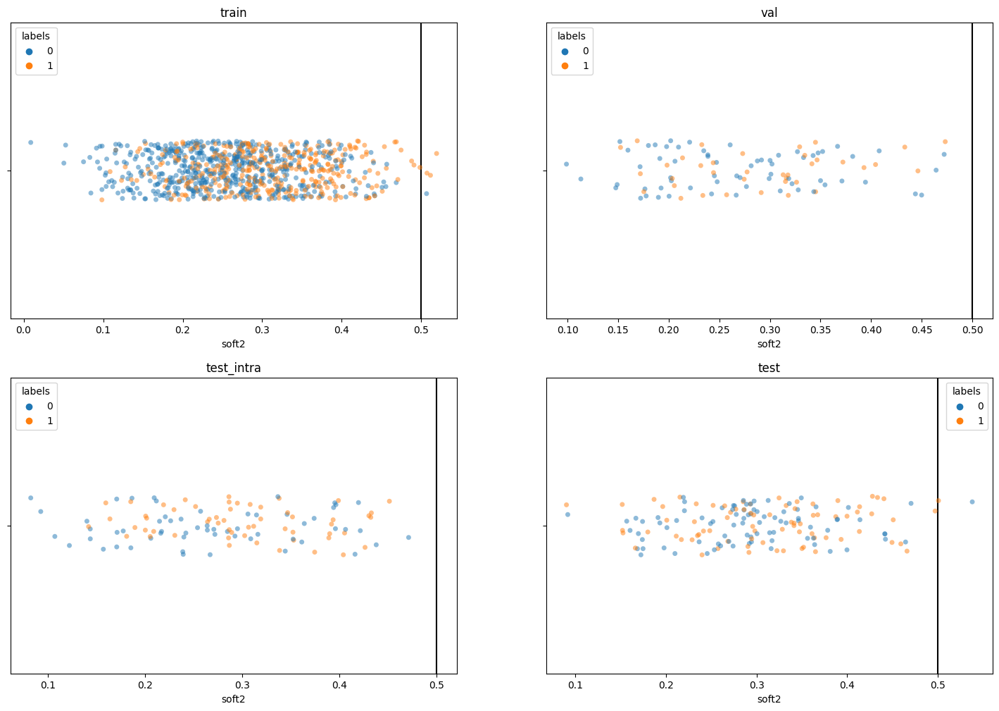

In [35]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/supervised/schiz/strat_bis_R/16-42-45_1/cing_schiz_strat_bis_outputs')

plot_outputs()

# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

# schiz embeddings in the UKB latent space

In [6]:
# load embeddings

embs_path = "/neurospin/dico/jchavas/Runs/59_analysis_ukbiobank/Output/trained_on_ukbiobank/ukbiobank_without_top-n=21070/14-48-19_0/cingulate_schiz_embeddings/full_embeddings.csv"
embs = pd.read_csv(embs_path)
embs.sort_values(by='ID', inplace=True, ignore_index=True)

# add meta_data to embs
embs = pd.concat([embs, used_subjects], axis=1)
print(embs[embs.ID != embs.participant_id])

embs = embs.drop('participant_id', axis=1)

embs

Empty DataFrame
Columns: [ID, dim1, dim2, dim3, dim4, dim5, dim6, dim7, dim8, dim9, dim10, participant_id, sex, age, diagnosis, study, site]
Index: []


,ID,dim1,dim2,dim3,dim4,dim5,dim6,dim7,dim8,dim9,dim10,sex,age,diagnosis,study,site
0,10171,-9.445521,2.793139,-6.038199,0.245251,1.110935,4.664828,-4.064306,12.102379,-5.530440,5.694892,M,24.000000,control,CNP,CNP
1,10189,3.374356,0.801492,0.774204,-0.437204,-8.454095,-25.683666,-3.587720,4.464036,17.963913,-7.330339,M,49.000000,control,CNP,CNP
2,10193,7.003187,-1.757195,-3.825077,2.942009,1.750850,5.349521,2.856431,-5.270902,-2.263652,-2.232688,M,40.000000,control,CNP,CNP
3,10206,-4.953732,3.329954,-3.524037,15.854950,1.792695,8.303099,-5.436065,1.747165,-5.326971,8.911986,M,21.000000,control,CNP,CNP
4,10217,-17.153538,-0.151430,-2.787651,-9.669209,3.050715,8.681571,-0.690588,-1.452070,6.114533,0.051021,F,33.000000,control,CNP,CNP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1287,st110288,-13.356595,0.224751,2.279253,-3.407003,-2.535921,1.527628,-1.652961,8.405345,4.619803,13.413349,1.0,22.457534,schizophrenia,SCHIZCONNECT-VIP,vip
1288,va110289,-0.525837,-10.703436,6.769352,-1.535155,-5.382220,-14.613190,7.998844,1.755083,6.081125,11.821366,1.0,48.536986,control,SCHIZCONNECT-VIP,vip
1289,ye110322,-7.727305,-14.037942,6.269331,-9.158898,7.247839,-1.430664,-0.756406,-6.266303,1.449549,5.143420,0.0,19.575342,schizophrenia,SCHIZCONNECT-VIP,vip
1290,yh100442,0.810232,-0.267389,-9.346312,2.363625,-8.246139,-12.389084,8.127793,3.778783,1.240460,-12.506764,0.0,24.005479,control,SCHIZCONNECT-VIP,vip


In [9]:
dims = ['dim' + str(i) for i in range(1,11)]

0       CNP
1       CNP
2       CNP
3       CNP
4       CNP
       ... 
1287    vip
1288    vip
1289    vip
1290    vip
1291    vip
Name: site, Length: 1292, dtype: object

### Direct data

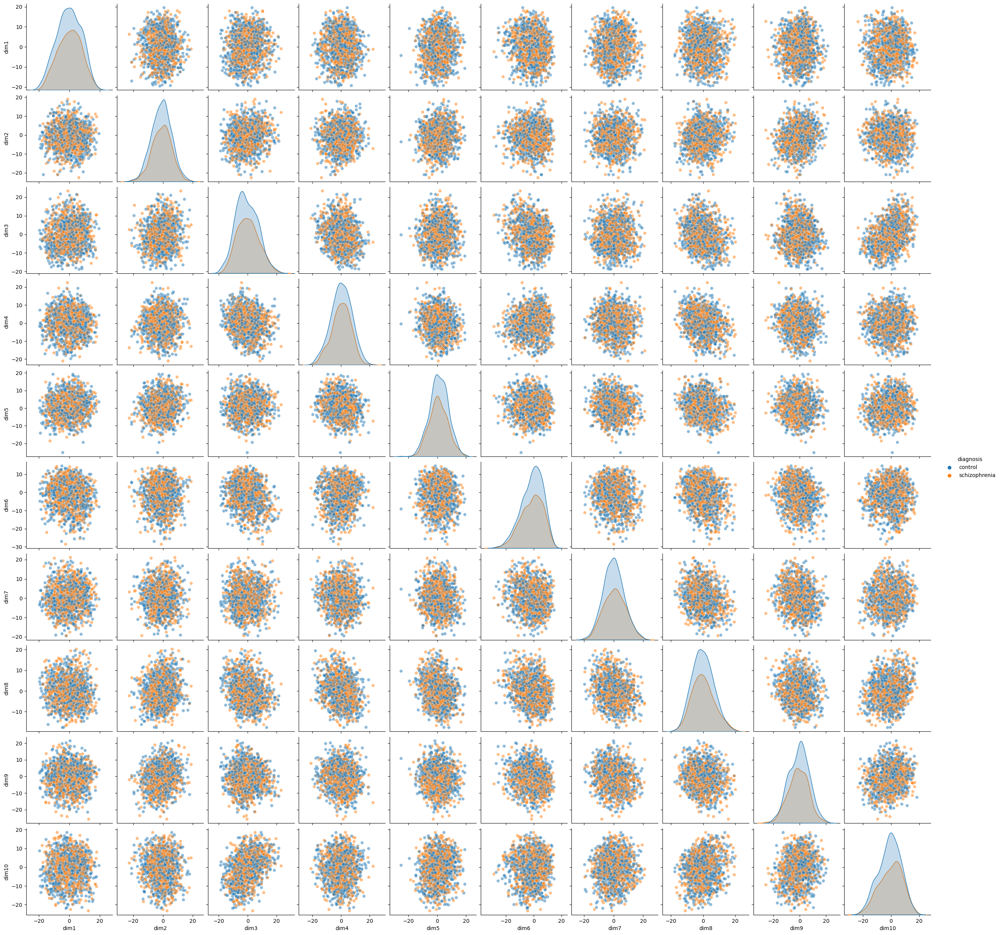

In [20]:
hue = 'diagnosis'
sns.pairplot(embs[dims + [hue]], hue=hue, plot_kws={'alpha': 0.5})

### PCA

<Axes: xlabel='pc1', ylabel='pc2'>

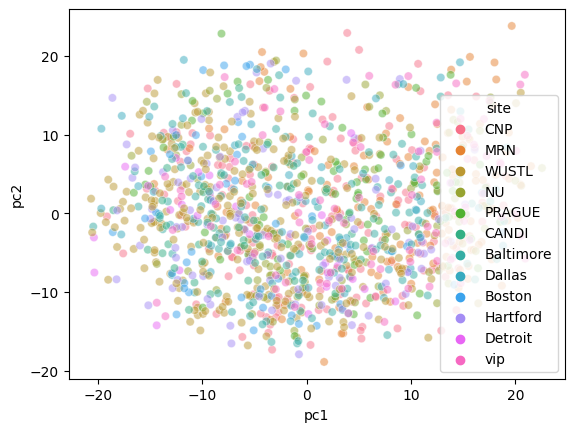

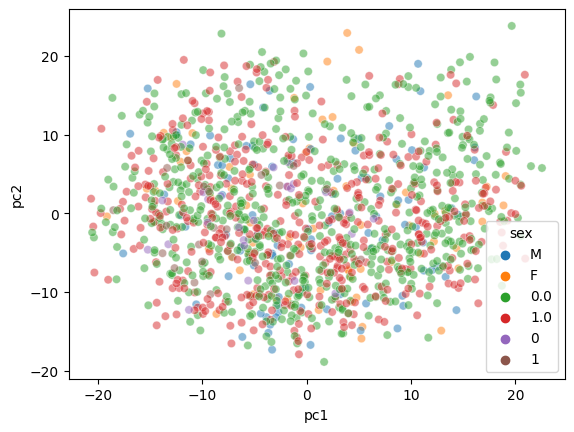

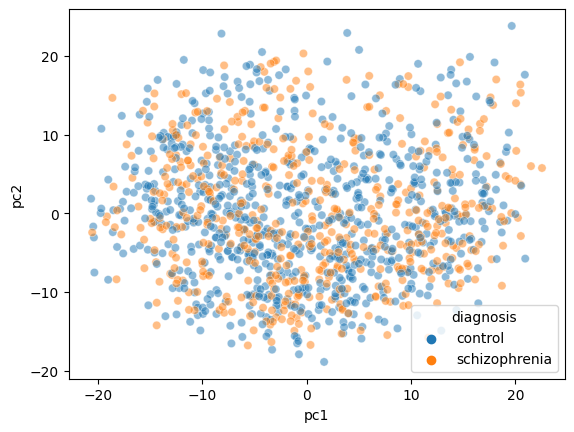

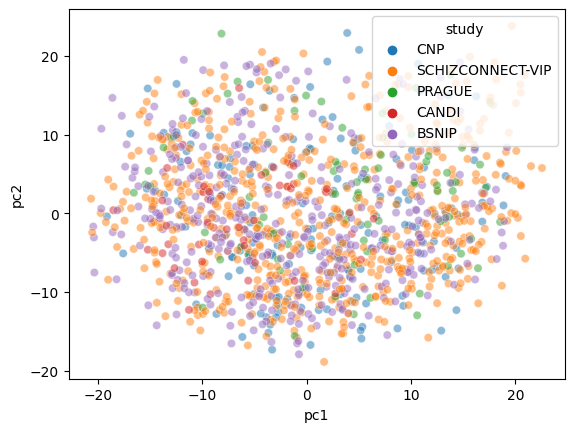

In [31]:
pca = PCA(n_components=2)

pca_embs = pca.fit_transform(embs[dims])

pca_df = pd.DataFrame(pca_embs, columns=['pc1', 'pc2'])
pca_df['site'] = embs['site']
pca_df['sex'] = embs['sex']
pca_df['diagnosis'] = embs['diagnosis']
pca_df['study'] = embs['study']

sns.scatterplot(pca_df, x='pc1', y='pc2', hue='site', alpha=0.5)
plt.figure()
sns.scatterplot(pca_df, x='pc1', y='pc2', hue='sex', alpha=0.5)
plt.figure()
sns.scatterplot(pca_df, x='pc1', y='pc2', hue='diagnosis', alpha=0.5)
plt.figure()
sns.scatterplot(pca_df, x='pc1', y='pc2', hue='study', alpha=0.5)

### umap

/neurospin/dico/agaudin/Runs/09_new_repo/2023_agaudin_jchavas_folding_supervised/venv_local/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


<Axes: xlabel='pc1', ylabel='pc2'>

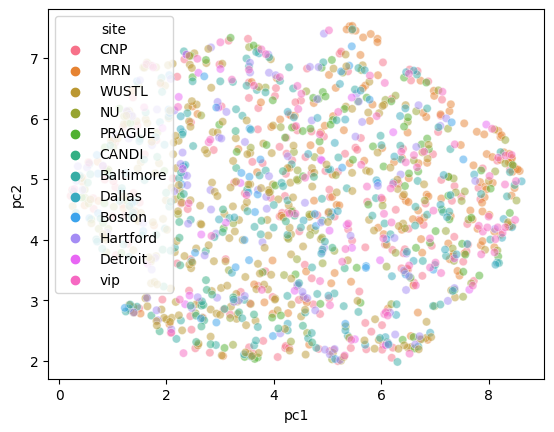

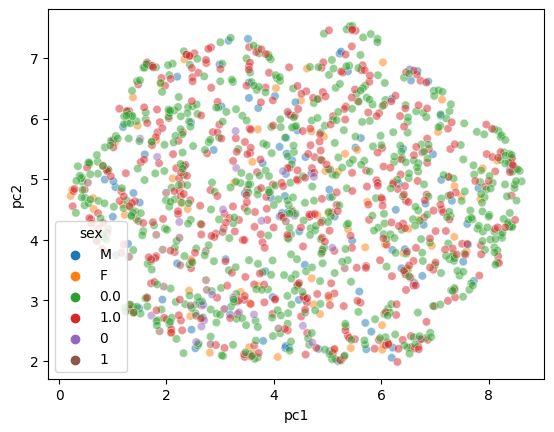

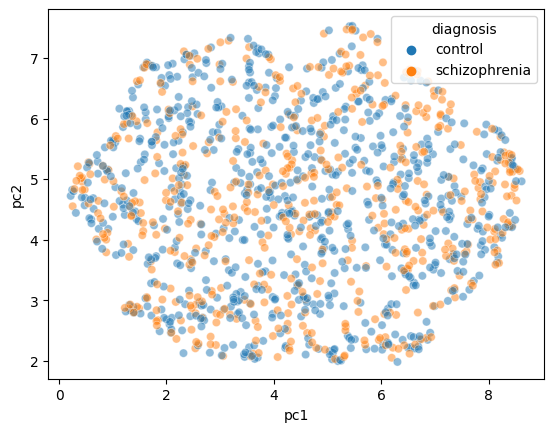

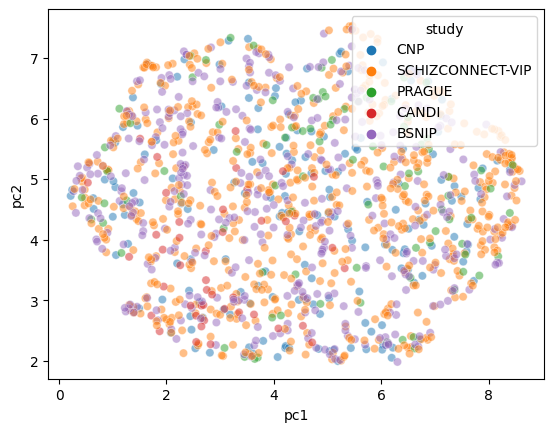

In [33]:
umap = UMAP()

umap_embs = umap.fit_transform(embs[dims])

umap_df = pd.DataFrame(umap_embs, columns=['pc1', 'pc2'])
umap_df['site'] = embs['site']
umap_df['sex'] = embs['sex']
umap_df['diagnosis'] = embs['diagnosis']
umap_df['study'] = embs['study']

sns.scatterplot(umap_df, x='pc1', y='pc2', hue='site', alpha=0.5)
plt.figure()
sns.scatterplot(umap_df, x='pc1', y='pc2', hue='sex', alpha=0.5)
plt.figure()
sns.scatterplot(umap_df, x='pc1', y='pc2', hue='diagnosis', alpha=0.5)
plt.figure()
sns.scatterplot(umap_df, x='pc1', y='pc2', hue='study', alpha=0.5)

# Output for schiz pretrained UKB

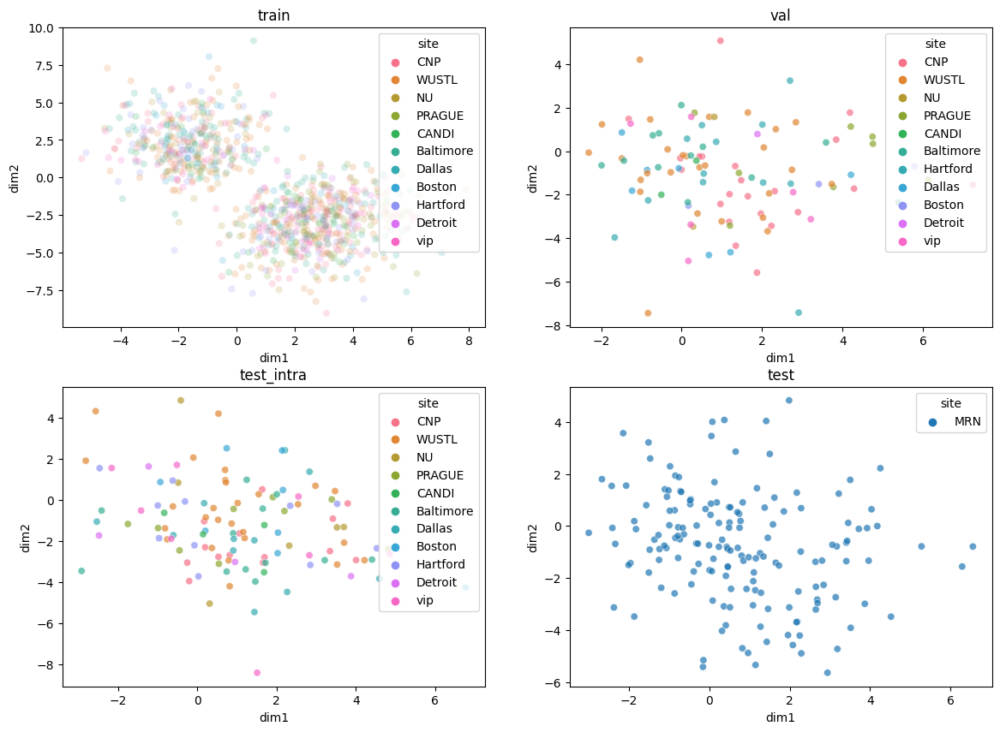

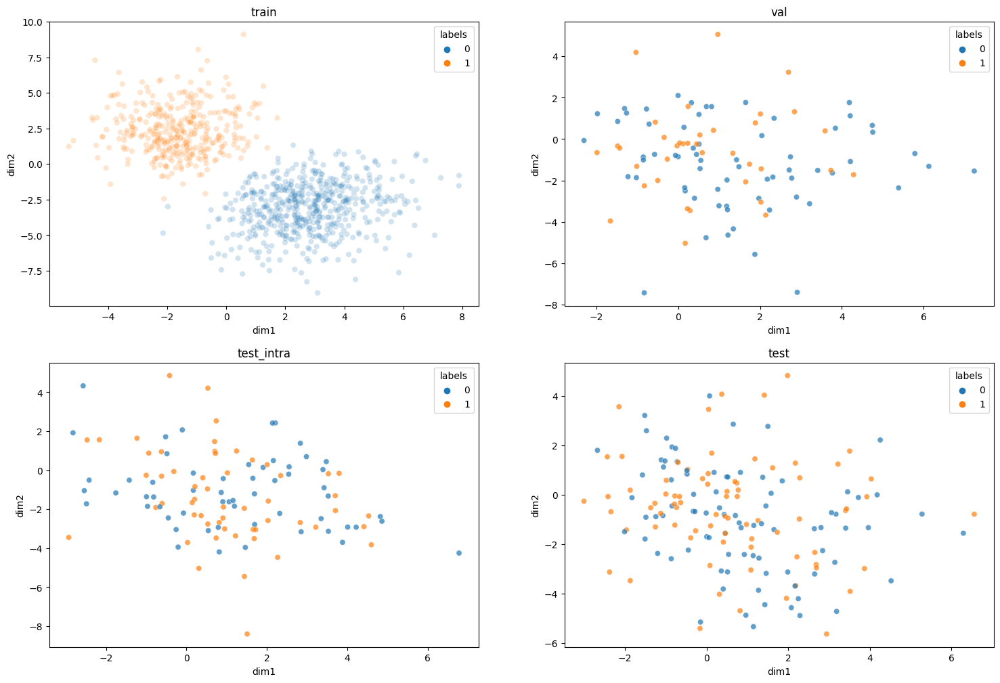

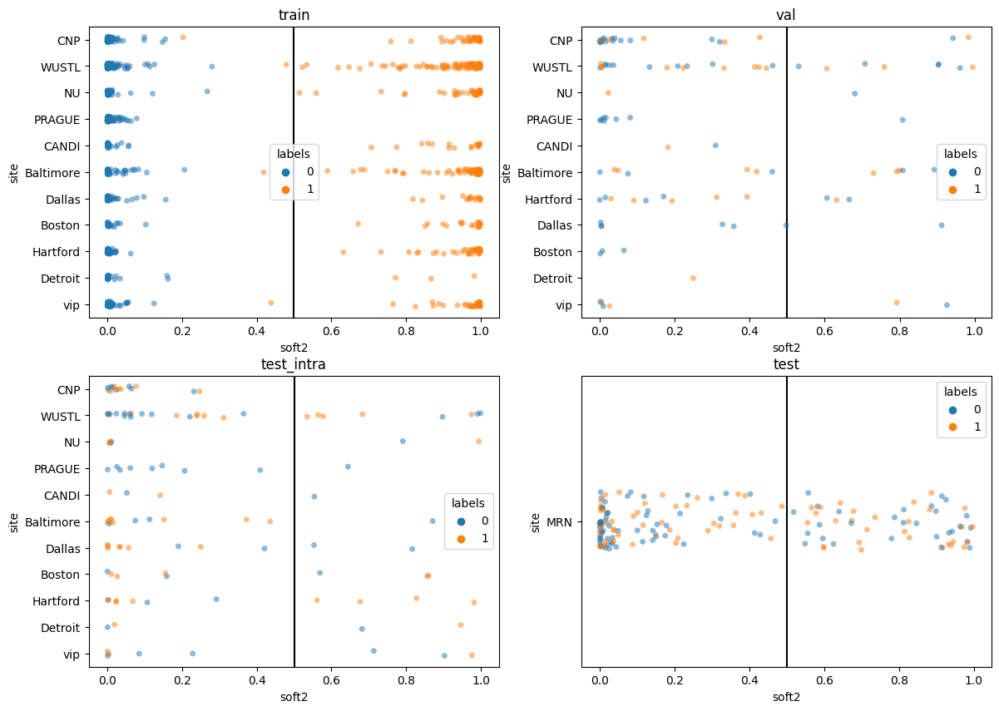

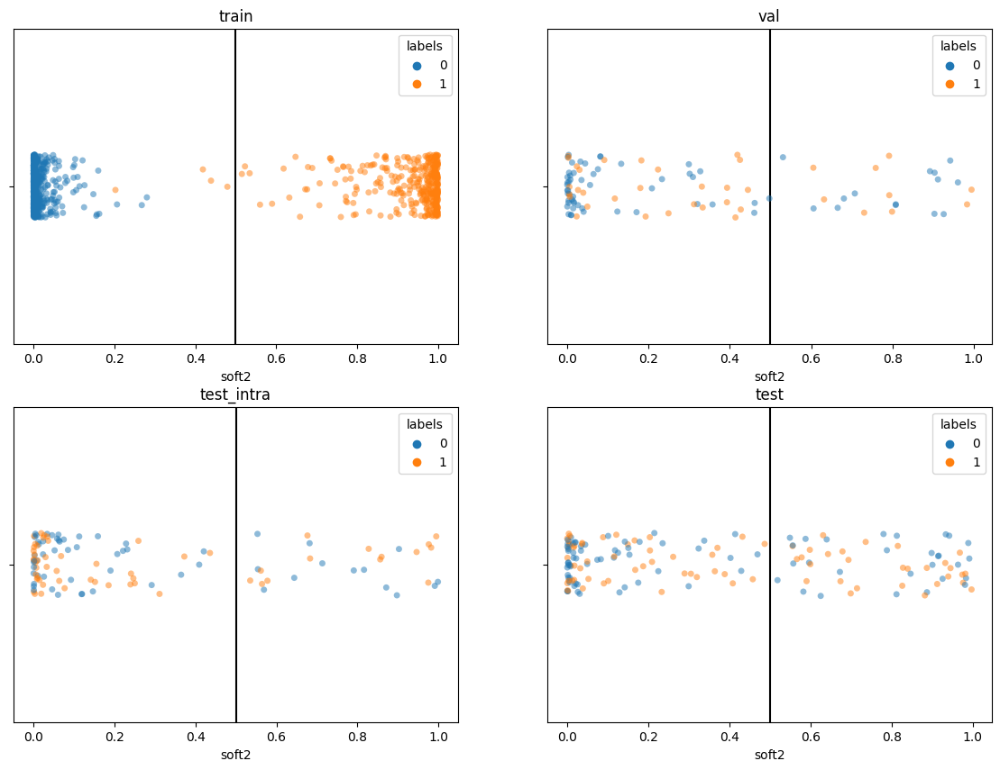

In [53]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/2023-06-20/15-42-18_2/cing_schiz_strat_bis_outputs')

plot_outputs()

# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

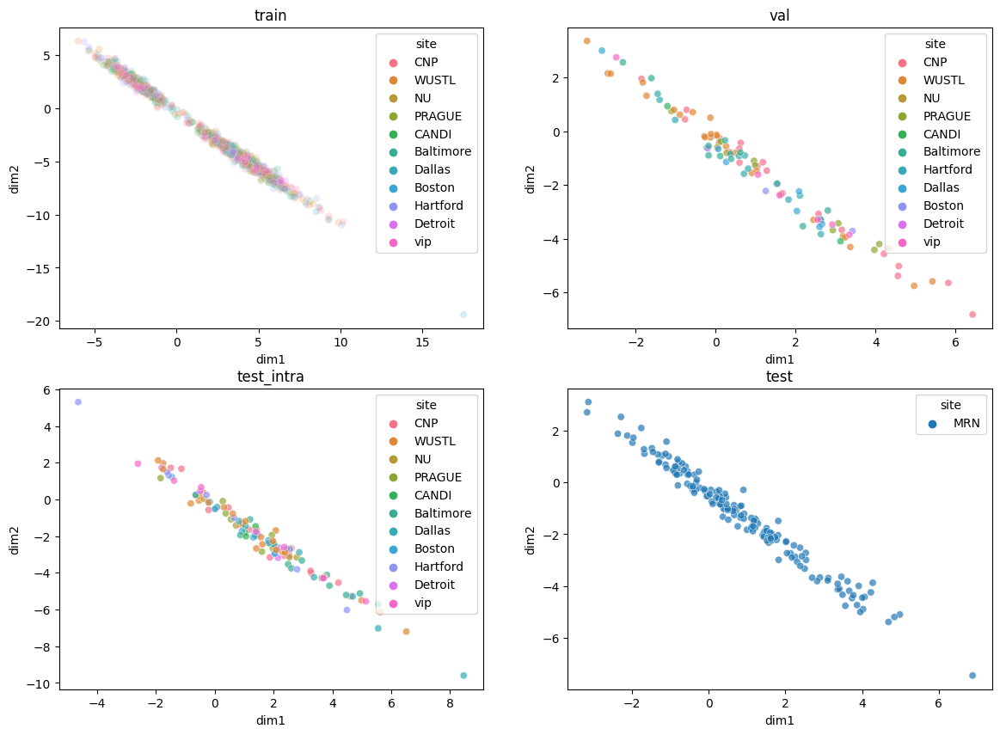

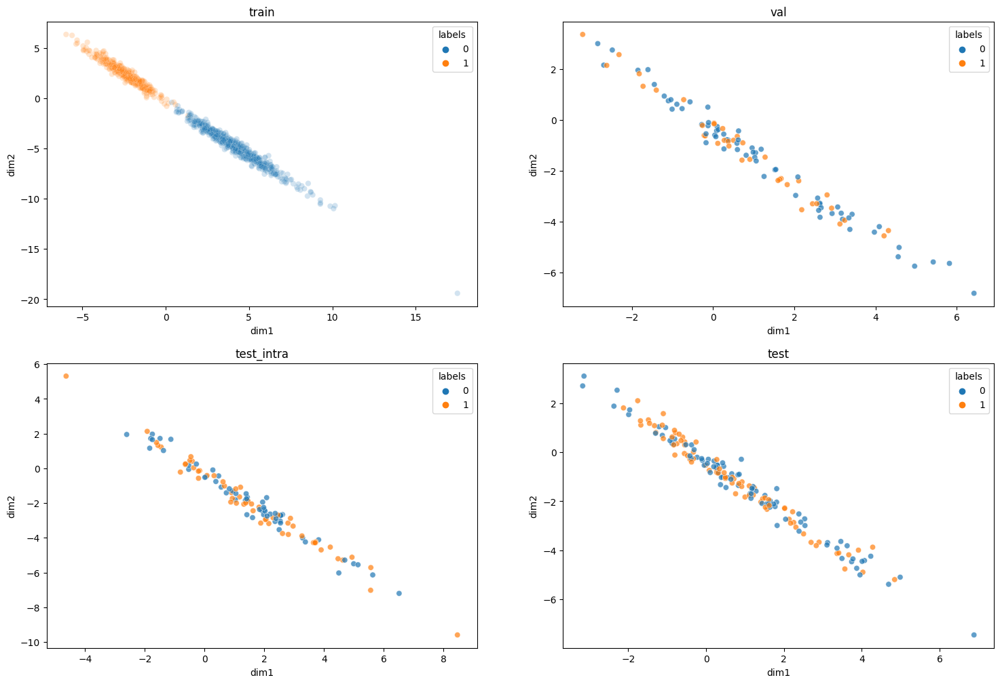

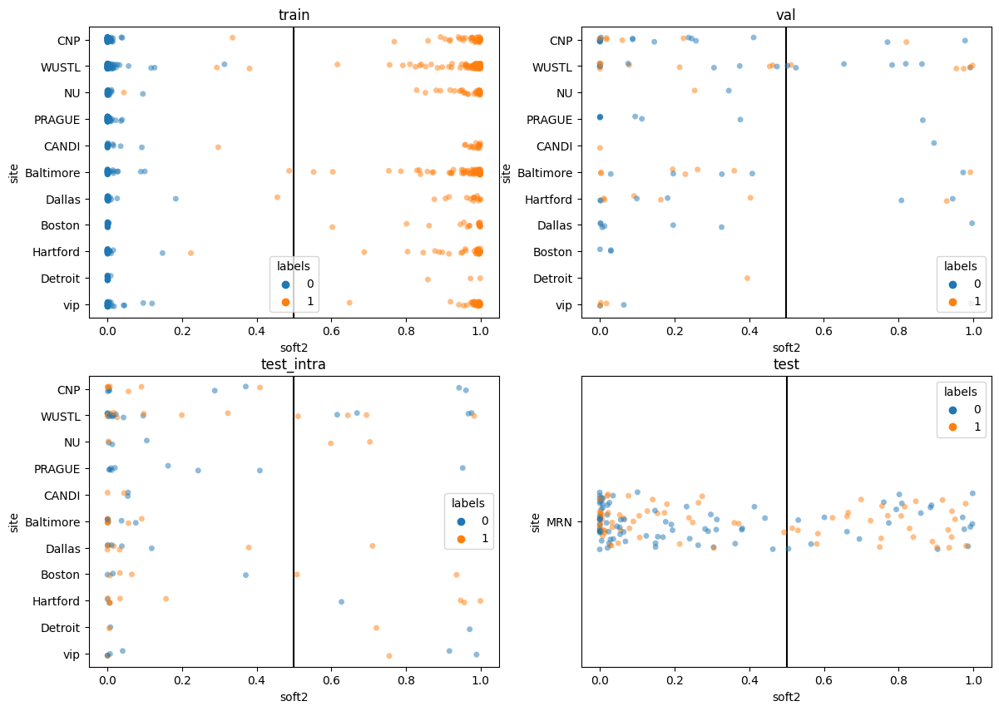

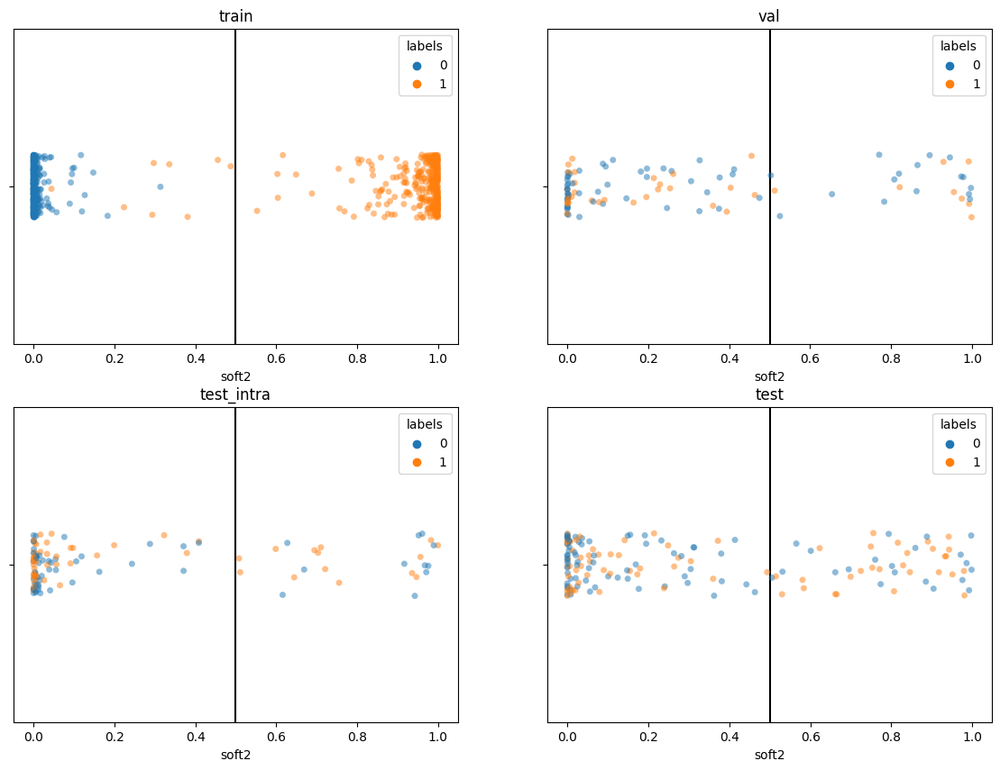

In [54]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/2023-06-20/15-42-18_1/cing_schiz_strat_bis_outputs')

plot_outputs()

# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()

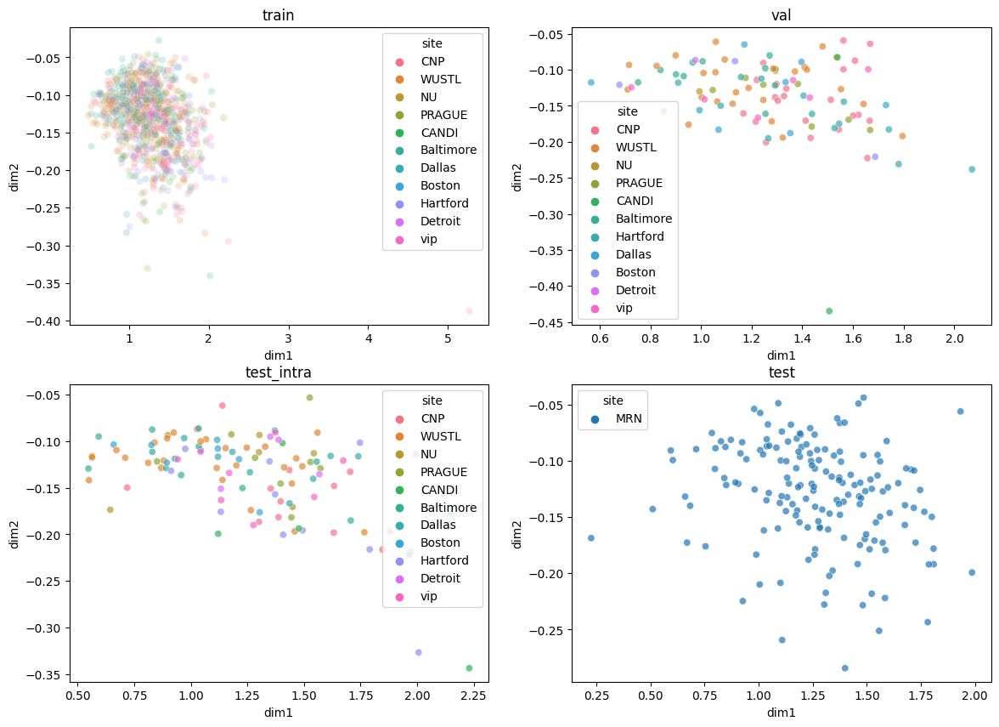

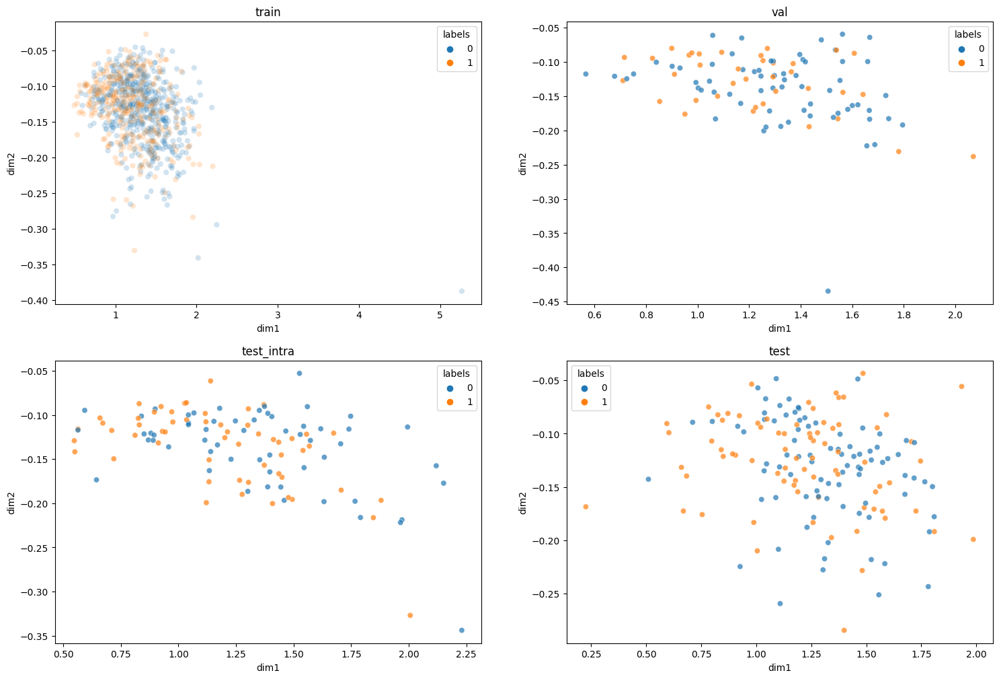

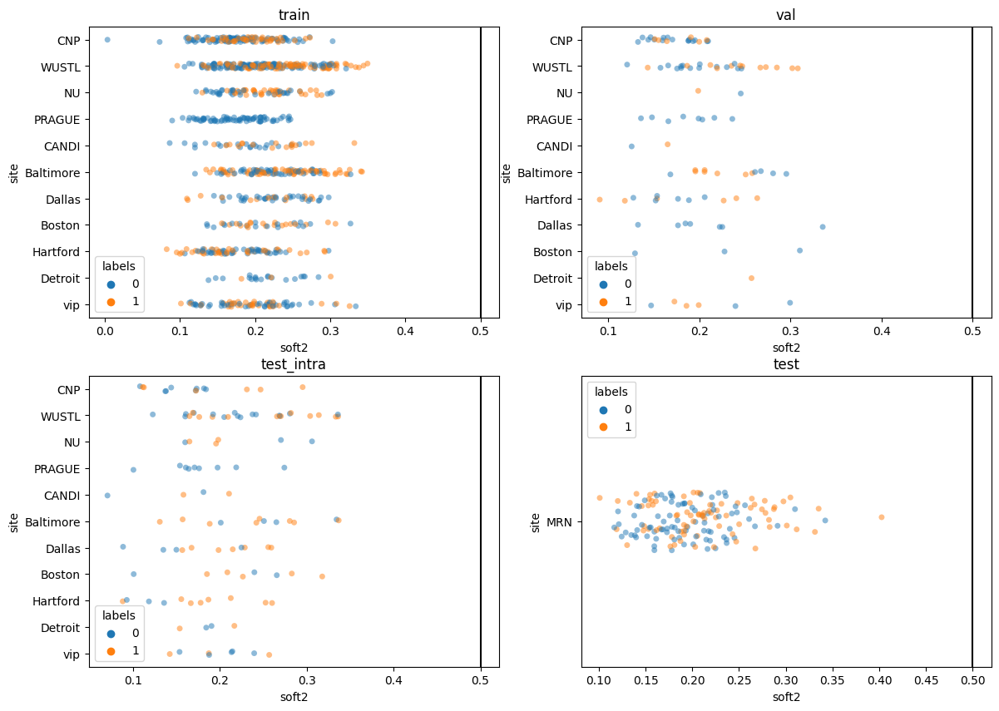

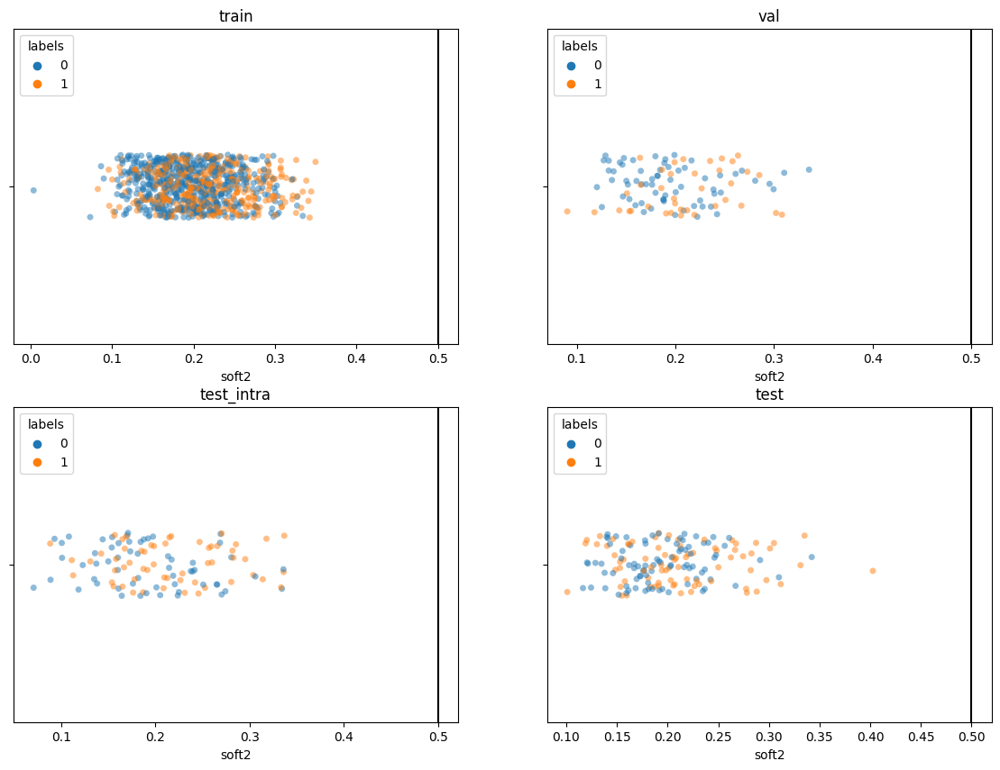

In [55]:
train_outputs, val_outputs, test_intra_outputs, test_outputs = load_and_process('/neurospin/dico/agaudin/Runs/09_new_repo/Output/2023-06-20/15-42-18_0/cing_schiz_strat_bis_outputs')

plot_outputs()

# les probas de classe 1
train_outputs = add_softmax(train_outputs)
val_outputs = add_softmax(val_outputs)
test_intra_outputs = add_softmax(test_intra_outputs)
test_outputs = add_softmax(test_outputs)


plot_softmaxes()